In [1]:
import scanpy as sc
import pandas as pd
# from scipy.io import mmread
import numpy as np
import scipy.sparse as sp
import os
import anndata as ad

# from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import scanpy.external as sce  # Harmony 在 sc.external
# from sklearn.decomposition import PCA
import harmonypy as hm
import warnings
warnings.simplefilter("ignore", category=pd.errors.PerformanceWarning)

In [2]:
import scanpy as sc

adata_new  = sc.read_h5ad("./all.h5ad")   # 54090 × 27390 save from martix.mtx
adata_full  = sc.read_h5ad("./aml_all.h5ad")               # 54090 × 2000 convert by seurat

d:\Gaol\miniconda3\envs\geneformer_env\lib\site-packages\anndata\compat\__init__.py:371: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(


In [3]:
adata_full.obs_names.equals(adata_new.obs_names)

True

In [4]:
# 1) 对齐细胞顺序（非常重要）
adata_full_aligned = adata_full[adata_new.obs_names, :]



# 2) 用全基因矩阵 + 新对象的 obs / var 重建 AnnData
adata_merged = ad.AnnData(
    X = adata_full_aligned.X,
    obs = adata_new.obs.copy(),
    var = adata_full_aligned.var.copy()
)

# 3) 拷贝“细胞维度”的结构信息
adata_merged.obsm = adata_new.obsm.copy()
adata_merged.uns  = adata_new.uns.copy()
adata_merged.obsp = adata_new.obsp.copy()

# （可选）如果你想保留原来 HVG 版的 X，也可以存一份：
# adata_merged.layers["X_hvg"] = adata_new.X.copy()

print("Merged shape:", adata_merged.shape)  # 应该是 (54090, 27390)

# 4) 保存
adata_merged.write("BMPB.h5ad")

Merged shape: (103731, 27390)


In [5]:
adata = sc.read_h5ad("BMPB.h5ad") # 54090 × 27390 save from martix.mtx


In [6]:
pt_map = {
    4: 1,
    7: 2,
    16: 3,
    17: 4,
    12: 5,
    2: 6,
    3: 7,
    20: 8,
    22: 9,
    9: 10,
    1: 11,
    10: 12,
    11: 13,
    13: 14,
    18: 15,
    19: 16,
    6: 17,
    15: 18,
    5: 19,
    8: 20,
    14: 21,
    21: 22
}

old_pt = adata.obs['patient'] + 1
# 映射到新 PT
adata.obs['PT'] = old_pt.map(pt_map)
adata.obs['PT'] = adata.obs['PT'].astype('category')

# 看哪些 old_pt 没有成功映射
missing = old_pt[adata.obs['PT'].isna()].unique()
print("Unmapped old PT:", missing)

print(pd.crosstab(old_pt, adata.obs['PT']))

Unmapped old PT: [26 27 28 23 24 25]
PT        1.0   2.0   3.0  4.0  5.0  6.0   7.0  8.0  9.0  10.0  ...  13.0  \
patient                                                         ...         
1           0     0     0    0    0    0     0    0    0     0  ...     0   
2           0     0     0    0    0  528     0    0    0     0  ...     0   
3           0     0     0    0    0    0  4009    0    0     0  ...     0   
4        9850     0     0    0    0    0     0    0    0     0  ...     0   
5           0     0     0    0    0    0     0    0    0     0  ...     0   
6           0     0     0    0    0    0     0    0    0     0  ...     0   
7           0  5388     0    0    0    0     0    0    0     0  ...     0   
8           0     0     0    0    0    0     0    0    0     0  ...     0   
9           0     0     0    0    0    0     0    0    0   245  ...     0   
10          0     0     0    0    0    0     0    0    0     0  ...     0   
11          0     0     0    0    0    

In [7]:
nd_patients = {4, 7, 1, 5,6, 2, 3}

# 新增一列 NDRR：默认 RR，命中集合的设为 ND
adata.obs['NDRR'] = adata.obs['PT'].apply(
    lambda x: 'ND' if x in nd_patients else 'RR'
)

# 设为分类变量（可选但推荐）
adata.obs['NDRR'] = adata.obs['NDRR'].astype('category')

# 快速检查
print(adata.obs['NDRR'].value_counts())
print(pd.crosstab(adata.obs['PT'], adata.obs['NDRR']))

NDRR
RR    31257
ND    21920
Name: count, dtype: int64
NDRR    ND    RR
PT              
1.0   9850     0
2.0   5388     0
3.0   1431     0
4.0    161     0
5.0    553     0
6.0    528     0
7.0   4009     0
8.0      0   523
9.0      0   781
10.0     0   245
11.0     0  1888
12.0     0  2138
13.0     0  2723
14.0     0  1487
15.0     0  9091
16.0     0   123
17.0     0  4043
18.0     0   942
19.0     0  1441
20.0     0   883
21.0     0  1328
22.0     0  3621


In [8]:
change_patients = { 7, 10}

# 新增一列 NDRR：默认 RR，命中集合的设为 ND
adata.obs['NDRR'] = adata.obs['PT'].apply(
    lambda x: 'ND' if x in nd_patients else 'RR'
)

# 设为分类变量（可选但推荐）
adata.obs['NDRR'] = adata.obs['NDRR'].astype('category')

# 快速检查
print(adata.obs['NDRR'].value_counts())
print(pd.crosstab(adata.obs['PT'], adata.obs['NDRR']))

NDRR
RR    31257
ND    21920
Name: count, dtype: int64
NDRR    ND    RR
PT              
1.0   9850     0
2.0   5388     0
3.0   1431     0
4.0    161     0
5.0    553     0
6.0    528     0
7.0   4009     0
8.0      0   523
9.0      0   781
10.0     0   245
11.0     0  1888
12.0     0  2138
13.0     0  2723
14.0     0  1487
15.0     0  9091
16.0     0   123
17.0     0  4043
18.0     0   942
19.0     0  1441
20.0     0   883
21.0     0  1328
22.0     0  3621


In [9]:
adata.obs.loc[adata.obs['PT'].isin([7, 10]), 'response'] = 2

adata.obs['response'] = adata.obs['response'].astype(str)
adata.obs['response'] = adata.obs['response'].astype('category')

In [10]:
adata.write("BMPB.h5ad")

In [11]:
adata = sc.read_h5ad("BMPB.h5ad") # 54090 × 27390 save from martix.mtx


In [12]:
adata.obs['relapse'].value_counts()

relapse
17752.0    4009
18336.0    2723
18396.0    2138
18183.0    1888
17728.0    1487
18002.0     553
17928.0     528
17729.0     245
18276.0     123
Name: count, dtype: int64

In [13]:
adata[
    (adata.obs['category'] == 0) & (adata.obs['source'] != 0)
].obs['patient'].value_counts()

patient
3     9758
6     5388
2     2274
15    1431
Name: count, dtype: int64

In [14]:
pd.crosstab(adata.obs['patient'], adata.obs["response"])


response,0,1,2
patient,,,
0,0,1888,0
1,0,528,0
2,0,0,4009
3,0,9850,0
4,0,0,1441
5,0,0,4043
6,0,5388,0
7,0,0,883
8,0,0,245


In [15]:

pd.crosstab(adata.obs['PT'], adata.obs["response"])
# 'patient' PT# single cell (old sample name) 22-27 HC -1 !!!!!
# 'source' 0 BM 1 PB
# "timing" 2 HC 0 pre 1 post
# 'response' 0 HC 1 responder 2 non responder 
# "category" 0 ND 1 RR

response,1,2
PT,,
1.0,9850,0
2.0,5388,0
3.0,1431,0
4.0,161,0
5.0,553,0
6.0,528,0
7.0,0,4009
8.0,523,0
9.0,781,0


In [16]:
hierarchical_markers = {
    "CD4": {
        # "general": ["CD4", "IL7R", "MAL", "LEF1", "LTB", "LDHB", "TPT1", "TRAC", "TCF7", "TMSB10", "LEPROTL1","CD3D", "CD3E","CD3G", "CD27"],   # broad CD4 T cell markers
         "general": ["CD4", "IL7R", "MAL", "LTB"],   # broad CD4 T cell markers
        "subtypes": {
            "CD4 Memory T cells": ["CXCR3", "IL7R", "LTB"],
            "CD4 Naive T cells": ["LEF1","TCF7","SELL","CD44"], #Naive "IL7R", "LTB"
            "CD4 CTL T cells": ["GZMB","PRF1","GNLY","NKG7"],
            "CD4 Exhausted T cells": ["CTLA4","LAG3","TIGIT","HAVCR2","PDCD1"],
            "CD4 Th1 T cells": ["TBX21","STAT4","IFNG","IL12A"],
            "CD4 Th2 T cells": ["STAT6","GATA6","IL4"],
            "CD4 Th17 T cells": ["IL7RA","STAT3","RORC"],
            "CD4 Tfh T cells": ["BCL6","CXCR5"],
            "Treg": ["TGFB1","FOXP3","IL2RA","IKZF2"]
        }
    },
    "CD8": {
        # "general": ["CD8A","CD8B","NELL2", "CD3D", "CD3E", "S100B", "GZMH", "CD3G", "TRGC2", "CCL5"],
        "general": ["CD8A","CD8B", "CD3D" ],
        "subtypes": {
            "CD8 Naive T cells": ["NELL2","CD8B","CCR7","LEF1","SELL","IL7R"],
            "CD8 Effector Memory T cells": ["PRF1","FGFBP2","FCGR3A","KLRD1","NKG7","KLRG1","CX3CR1"],
            "CD8 Exhausted T cells": ["CTLA4","LAG3","TIGIT","PDCD1","TOX"],
            "CD8 CTL T cells": ["GZMB","PRF1","GNLY","NKG7","GZMA"],
            "MAIT": ["KLRB1","IL7R","SLC4A10","RORC"]
        }
    },
    # "B": {
    #     "general": ["FCRL1", "FCRL2", "CD22", "ARHGAP24", #Azimuth
    #                                                            "BANK1", "MS4A1", "RALGPS2", "CD37",
    #                                                            "SWAP70", "CD79A",
    #                                                            "CD19", "B220"],#Abbas Lab
    #     "subtypes": {}
    # },
    "B": {
        "general": ["MS4A1", "CD79A", "CD79B", "BANK1", "RALGPS2"],
        "subtypes": {
            "B intermediate": ["MS4A1", "TNFRSF13B", "IGHM", "IGHD", "AIM2", "CD79A", "LINC01857", "RALGPS2", "BANK1", "CD79B"],
            "B memory": ["MS4A1", "COCH", "AIM2", "BANK1", "SSPN", "CD79A", "TEX9", "RALGPS2", "TNFRSF13C", "LINC01781"],
            "B naive": ["IGHM", "IGHD", "CD79A", "IL4R", "MS4A1", "CXCR4", "BTG1", "TCL1A", "CD79B", "YBX3"],
            "Plasmablast": ["IGHA2", "MZB1", "TNFRSF17", "DERL3", "TXNDC5", "TNFRSF13B", "POU2AF1", "CPNE5", "HRASLS2", "NT5DC2"]
        }
    },

    "pre B": {
        "general": ["NPY", "LCN6", "RAG2", "HMHB1",
                                                               "ARPP21", "AKAP12", "RAG1", "C10orf10",
                                                               "CYGB", "SLC8A1-AS1"],#Abbas Lab
        "subtypes": {}
    },

    # ---- Myeloid / Mono / Macrophage ----
    "Mono": {
        "general": ["LYPD2", "FOLR3", "CLEC4E", "LILRA1",
                    "CDA", "RBP7", "CD300LF", "FPR1", "CD93", "MTMR11"],
        "subtypes": {
            "CD14 Mono": ["FOLR3", "CLEC4E", "MCEMP1", "RBP7",
                          "CDA", "FPR1", "CD300E", "C5AR1",
                          "CD93", "APOBEC3A"],
            "CD16 Mono": ["LYPD2", "VMO1", "TPPP3", "C1QA",
                          "C5AR1", "CD300E", "GPBAR1", "LILRA1",
                          "HES4", "APOBEC3A"]
        }
    },
    # ===== NK lineage =====
    "NK": {
        "general": ["TRDC", "FCER1G", 
                    "KLRF1" 
                    ],
        # "general": ["NKG7", "KLRC1", "KLRD1", "KLRB1", 
        #                                                        "KIR2DL1", "KIR3DL1", "KIR2DL3", "KIR3DL2",
        #                                                        "KIR3DL3", "GNLY", "NCAM1", "FCGR3A"],
        "subtypes": {
            "NK CD56-dim": ["GNLY", "TYROBP", "NKG7", "GZMB",  "PRF1", "FGFBP2", "SPON2"],
            "NK Proliferating": ["MKI67" , "TYMS",  "TOP2A", "PCLAF", "CD247", "CLSPN", "ASPM"],
            "NK CD56-bright": ["XCL2",  "SPINK2", "KLRC1", "XCL1", "SPTSSB", "PPP1R9A", "NCAM1", "TNFRSF11A"]
        }
    },
    "EMPs": {
        "general": ["MYCT1", "CRHBP", "NPR3", "AVP", "HPGDS", "CRYGD","IGSF10", "PBX1", 
                    "CYTL1","GATA2"
                    ],
        
        "subtypes": {
            "Megakaryocyte": [
                "GFI1B", "SELP", "GP1BA", "CD9", "ITGA2B", "GATA2", "FLI1",
                "GP1BB", "VWF", "THPO", "ELF1", "THBS1", "MPIG6B", "GP9",
                "F2R", "FOG1", "NFE2", "SPI1", "PF4"
            ],
            "Erythroid progenitor": [
                "GATA1", "KLF1", "FCER1A", "ITAG2B", "EPOR", "HBD", "ZFPM1",
                "GATA2", "GYPA", "TFRC", "TFR2", "CSF2RB", "APOE", "APOC1",
                "CNRIP1", "FOXO3", "ETS1", "BRD1", "TAL1"
            ]
        }
    },

    # ---- DC ----
    "DC": {
        "general": ["CLEC4C", "PROC", "SCT", "SCN9A",
                    "SHD", "PPM1J", "ENHO", "CLEC10A",
                    "LILRA4", "DNASE1L3"],
        "subtypes": {
            'ASDC':['PPP1R14A', 'LILRA4', 'AXL', 'IL3RA', 'SCT', 'SCN9A', 'LGMN', 'DNASE1L3', 'CLEC4C', 'GAS6'],
            'cDC1':['CLEC9A', 'DNASE1L3', 'C1orf54', 'IDO1', 'CLNK', 'CADM1', 'FLT3', 'ENPP1', 'XCR1', 'NDRG2'],
            'cDC2':['FCER1A', 'HLA-DQA1', 'CLEC10A', 'CD1C', 'ENHO', 'PLD4', 'GSN', 'SLC38A1', 'NDRG2', 'AFF3'],
            'pDC':['ITM2C', 'PLD4', 'SERPINF1', 'LILRA4', 'IL3RA', 'TPM2', 'MZB1', 'SPIB', 'IRF4', 'SMPD3']
        }
    },

    # ---- Progenitors / Stem cells ----
    "HSC": {
        "general": ["CD34", "AVP", "CRHBP"],
        "subtypes": {}
    },
    "CLP": {
        "general": ["ACY3", "PRSS2", "C1QTNF4", "SPINK2",
                    "SMIM24", "NREP", "CD34", "DNTT", "FLT3", "SPNS3"],
        "subtypes": {}
    },
    "GMP": {
        "general": ["SERPINB10", "RNASE3", "MS4A3", "PRTN3",
                    "ELANE", "AZU1", "CTSG", "RNASE2", "RETN", "NPW"],
        "subtypes": {}
    },

    # ---- Erythroid / Megakaryocyte ----
    # "Early Erythroid": {
    #     "general": [
    #         "CNRIP1",  "ITGA2B", "TFR2", "MAP7", "FSCN1", "APOC1" "GATA1", "KLF1", 
    #                 "CYTL1","GATA2",
    #                 ],
    #     "subtypes": {}
    # },
    # "Late Erythroid": {
    #     "general": ["CTSE", "TSPO2", "IFIT1B", "TMEM56",
    #                            "RHCE", "RHAG", "SPTA1", "ADD2",
    #                            "EPCAM", "HBG1"],
    #     "subtypes": {}
    # },
    "Macrophage": {
        "general": ["SPIC", "FABP3", "CD5L", "CCL18",
                    "C1QC", "C1QB", "FABP4", "C1QA",
                    "APOE", "SELENOP"],
        "subtypes": {}
    },
    "Erythroid": {
        "general": ['HBD', 'HBM', 'AHSP', 'ALAS2','CA1', 'SLC4A1', 'IFIT1B', 'TRIM58', 'SELENBP1', 'TMCC2'],
        "subtypes": {
            "Early Erythroid": ["CNRIP1", "GATA2", "ITGA2B", "TFR2",
                                "GATA1", "KLF1", "CYTL1", "MAP7",
                                "FSCN1", "APOC1"],
            "Late Erythroid": ["CTSE", "TSPO2", "IFIT1B", "TMEM56",
                               "RHCE", "RHAG", "SPTA1", "ADD2",
                               "EPCAM", "HBG1"]
        }
    },
    "Platelets": {
        "general": ["RGS18", "C2orf88", "TMEM40", "GP9",
                    "PF4", "PPBP", "DAB2", "SPARC",
                    "RUFY1", "F13A1"],
        "subtypes": {}
    }
}

In [17]:
celltype_colors_dict = {
    # ---- CD4 T ----
    "CD4": "#8dd3c7",
    "CD4 Memory T cells": "#66c2a5",
    "CD4 Naive T cells": "#99d8c9",
    "CD4 CTL T cells": "#41ae76",
    "CD4 Exhausted T cells": "#238b45",
    "CD4 Th1 T cells": "#005824",
    "CD4 Th2 T cells": "#b2e2e2",
    "CD4 Th17 T cells": "#7bccc4",
    "CD4 Tfh T cells": "#2ca25f",
    "Treg": "#006d2c",

    # ---- CD8 T ----
    "CD8": "#fb8072",
    "CD8 Naive T cells": "#fdbb84",
    "CD8 Effector Memory T cells": "#e34a33",
    "CD8 Exhausted T cells": "#b30000",
    "CD8 CTL T cells": "#f16913",
    "MAIT": "#fb6a4a",

    # ---- B cells ----
    "B": "#80b1d3",
    "B intermediate": "#4eb3d3",
    "B memory": "#2b8cbe",
    "B naive": "#7fcdbb",
    "Plasmablast": "#1c9099",

    # ---- pre B ----
    "pre B": "#08306b",

    # ---- Monocytes ----
    "Mono": "#bebada",
    "CD14 Mono": "#9e9ac8",
    "CD16 Mono": "#756bb1",

    # ---- NK ----
    "NK": "#fccde5",
    "NK CD56-dim": "#fa9fb5",
    "NK Proliferating": "#dd3497",
    "NK CD56-bright": "#980043",

    # ---- EMPs ----
    # ---- EMPs ----
    "EMPs": "#fdb462", 
    "Megakaryocyte": "#f47c3c",
    "Erythroid progenitor": "#fed98e",

    # ---- DC ----
    "DC": "#b3de69",
    "ASDC": "#66c2a5",
    "cDC1": "#31a354",
    "cDC2": "#006d2c",
    "pDC": "#b2df8a",

    # ---- Progenitors / Stem cells ----
    "HSC": "#bc80bd",
    "CLP": "#8c6bb1",
    "GMP": "#88419d",

    # ---- Macrophage ----
    "Macrophage": "#ffed6f",

    # ---- Erythroid ----
    "Erythroid": "#d9d9d9",
    "Early Erythroid": "#bdbdbd",
    "Late Erythroid": "#969696",

    # ---- Platelets ----
    "Platelets": "#a6cee3",

    # ---- Default ----
    "Unknown": "#999999"
}

# plt.figure(figsize=(8, 12))
# plt.axis("off")
# patches = [mpatches.Patch(color=color, label=ctype) for ctype, color in celltype_colors_dict.items()]

# plt.legend(
#     handles=patches,
#     loc='center left',
#     bbox_to_anchor=(0, 0, 1, 1),  # 左对齐，居中
#     ncol=2,                       # 分两列显示
#     fontsize=9,
#     title="Cell Type Color Legend",
#     title_fontsize=11,
#     frameon=False
# )

# plt.tight_layout()
# plt.show()
# plt.savefig("celltype_color_legend.png", dpi=300, bbox_inches="tight")


In [18]:
def main_cluster(adata_filter, n_neighbors, embs,resolution,threshold_main,threshold_sub,celltype_colors_dict):
    # for key in ['X_harmony', 'X_pca', 'X_tsne', 'X_pca_harmony']:
    #     adata_filter.obsm.pop(key, None)

    # Z = adata_filter.obsm[embs]
    # Z = Z.toarray() if hasattr(Z, 'toarray') else Z  # 转为 dense

    # ho = hm.run_harmony(Z, adata_filter.obs, vars_use=['patient'])
    # # harmonypy 返回是 (dims x cells)，所以转置
    # adata_filter.obsm[f'{embs}_harmony'] = ho.Z_corr.T

    sce.pp.harmony_integrate(adata_filter, key="patient", basis=embs)
    sc.pp.neighbors(adata_filter, use_rep=f'X_harmony', n_neighbors=n_neighbors)
    sc.tl.leiden(adata_filter, resolution=resolution)
    # ari3 = adjusted_rand_score(adata_filter.obs["dcellType"], adata_pre.obs["leiden"])
    # print("Harmony on embedding ARI:", ari3)
    cluster_annotations = {}
    cluster_topN = {}

    sc.tl.rank_genes_groups(adata_filter, 'leiden', method='wilcoxon')

    cluster_means = adata_filter.to_df().groupby(adata_filter.obs['leiden']).mean()
    cluster_means = (cluster_means - cluster_means.mean()) / cluster_means.std()
    for cluster in cluster_means.index:
        lineage_scores = {}
        
        # ---- broad lineage ----
        for lineage, info in hierarchical_markers.items():
            general_markers = [g for g in info["general"] if g in cluster_means.columns]
            if not general_markers:
                continue
            lineage_scores[lineage] = cluster_means.loc[cluster, general_markers].mean()
        
        if not lineage_scores:
            cluster_annotations[cluster] = "Unknown"
            continue
        best_lineage, best_lineage_score = max(lineage_scores.items(), key=lambda x: x[1])
        
        if best_lineage_score < threshold_main:
            cluster_annotations[cluster] = "Unknown"
            continue
        
        # ---- sub ----
        subtype_scores = {}
        subtypes = hierarchical_markers[best_lineage]["subtypes"]
        
        if subtypes:
            for subtype, markers in subtypes.items():
                markers_in_data = [g for g in markers if g in cluster_means.columns]
                if not markers_in_data:
                    continue
                subtype_scores[subtype] = cluster_means.loc[cluster, markers_in_data].mean()
        
        if not subtype_scores:
            cluster_annotations[cluster] = best_lineage
        else:
            best_subtype, best_sub_score = max(subtype_scores.items(), key=lambda x: x[1])
            if best_sub_score >= threshold_sub:
                cluster_annotations[cluster] = best_subtype
            else:
                cluster_annotations[cluster] = best_lineage
        
        cluster_topN[cluster] = {
            "lineage": (best_lineage, best_lineage_score),
            "lineage_scores": lineage_scores,  
            "top_subtypes": sorted(subtype_scores.items(), key=lambda x: x[1], reverse=True)[:3]
    }

    adata_filter.obs['celltype'] = adata_filter.obs['leiden'].map(cluster_annotations)
    adata_filter.obs['celltype'] = adata_filter.obs['celltype'].astype('category')
    # adata_filter.uns['celltype_colors'] = [
    #     celltype_colors_dict.get(c, "#CCCCCC")  
    #     for c in adata_filter.obs['celltype'].cat.categories
    #     ]
    topN_summary = pd.DataFrame({
        k: {
            **{
                f"main_type_{i+1}": sorted(v["lineage_scores"].items(), key=lambda x: x[1], reverse=True)[i][0]
                if len(v["lineage_scores"]) > i else None
                for i in range(3)
            },
            **{
                f"main_score_{i+1}": sorted(v["lineage_scores"].items(), key=lambda x: x[1], reverse=True)[i][1]
                if len(v["lineage_scores"]) > i else None
                for i in range(3)
            }
        }
        for k, v in cluster_topN.items()
    }).T

    return adata_filter, cluster_topN, topN_summary 

In [19]:
print(adata.obs['patient'].dtype)
print(adata.obs['patient'].unique())
print(adata.obs['patient'].isna().sum())

int32
[25 26 27  0  9 10 11 12 13 16 17  1 21  2  3  4  5  7 22 23 24 14 15 18
 19 20  6  8]
0


In [20]:
# response = 'hc' #'responder''nonresponder'
# treatrment = 'all' # 'pre' 'post'

adata_filter = adata[adata.obs['category']==2].copy()
adata_filter.obs['patient'] = (
    adata_filter.obs['patient']
    .astype(str)        # 数字 -> 字符串
    .astype('category') # 再转成分类变量
)
# adata_filter = adata_aml
# response = 'nonresponder' #'responder''nonresponder'
# treatrment = 'pre'# 'pre' 'post'
# adata_filter = adata_aml[adata_aml.obs['treat'] == treatrment].copy()
# adata_filter = adata_filter[adata_filter.obs['venetoclax'] == response].copy()
embs="X_harmony" #"X_FTHCembedding_V1-10M", "X_FTembedding_V1-10M"
n_neighbors = 10
resolution = 5.0 #除了pre-resp其他都用5
threshold_main = 0.1
threshold_sub = 0.1

adata_result, cluster_topN, topN_summary  = main_cluster(adata_filter, n_neighbors,embs, resolution,threshold_main,threshold_sub,celltype_colors_dict)

2026-02-25 10:03:36,080 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2026-02-25 10:03:42,758 - harmonypy - INFO - sklearn.KMeans initialization complete.
2026-02-25 10:03:42,957 - harmonypy - INFO - Iteration 1 of 10
2026-02-25 10:03:57,308 - harmonypy - INFO - Iteration 2 of 10
2026-02-25 10:04:11,764 - harmonypy - INFO - Iteration 3 of 10
2026-02-25 10:04:25,980 - harmonypy - INFO - Converged after 3 iterations
C:\Users\abdul\AppData\Local\Temp\ipykernel_12424\3554219977.py:14: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_filter, resolution=resolution)


d:\Gaol\miniconda3\envs\geneformer_env\lib\site-packages\scanpy\tools\_rank_genes_groups.py:479: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
d:\Gaol\miniconda3\envs\geneformer_env\lib\site-packages\scanpy\tools\_rank_genes_groups.py:479: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
d:\Gaol\miniconda3\envs\geneformer_env\lib\site-packages\scanpy\tools\_rank_genes_groups.py:479: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
d:\Gaol\miniconda3\envs\geneformer_env\lib\site-packages\scanpy\tools\_rank_genes_groups.py:479: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
C:\Users\abdul\AppData\Local\Temp\ipykernel_12424\3554219977.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=

In [21]:
# adata_result[adata_result.obs['leiden'].isin(['64','53'])].write("adata_HC_EMP.h5ad")
# adata_result[adata_result.obs['leiden']=='44'].write("adata_HC_HSC.h5ad")
adata_result[adata_result.obs['leiden']=='61'].write("./adatas/RR/RR_HC_NK.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['50','20'])].write("adata_HC_GMP1.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['48'])].write("adata_HC_cDC1.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['66'])].write("adata_HC_macrophage3.h5ad")
adata_result[adata_result.obs['leiden'].isin(['56','30','47','45','52'])].write("./adatas/RR/RR_HC_Erythroid.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['53'])].write("./adatas/RR/RR_HC_Megakaryocyte.h5ad")



In [22]:
# adata_result[adata_result.obs['leiden'].isin(['9','10','12','14'])].write("./adatas/RR/RR_pre_res_MPPCLP1.h5ad")
adata_result[adata_result.obs['leiden'].isin(['19'])].write("./adatas/RR/RR_pre_res_HSCLSC.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['26', '16', '21'])].write("./adatas/RR/RR_pre_res_EMP.h5ad")
adata_result[adata_result.obs['leiden'].isin(['15'])].write("./adatas/RR/RR_pre_res_MPPPreB.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['13'])].write("./adatas/RR/RR_pre_res_LEunknown.h5ad")#112/3447
# adata_result[adata_result.obs['leiden'].isin(['25'])].write("./adatas/RR/RR_pre_res_GMP1.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['3'])].write("./adatas/RR/RR_pre_res_MPPCLP2.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['7','18','31'])].write("./adatas/RR/RR_pre_res_Erythroid.h5ad") #272

In [23]:
# adata_result[adata_result.obs['leiden'].isin(['4'])].write("./adatas/RR/RR_pre_nres_HSCLSC.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['19'])].write("./adatas/RR/RR_pre_nres_MPPCLP1.h5ad")
adata_result[adata_result.obs['leiden'].isin(['51'])].write("./adatas/RR/RR_pre_nres_MPPPreB.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['42','14'])].write("./adatas/RR/RR_pre_nres_EMP.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['22'])].write("./adatas/RR/RR_pre_nres_HSCMacro.h5ad")#203 ×10892
# adata_result[adata_result.obs['leiden'].isin(['35'])].write("./adatas/RR/RR_pre_nres_LEcDC2.h5ad")#147 ×10892
# adata_result[adata_result.obs['leiden'].isin(['12', '20', '25','36','37','38','39','41','44'])].write("./adatas/RR/RR_pre_nres_Erythroid.h5ad")#1484 × 10892

In [24]:

adata_result[adata_result.obs['leiden'].isin(['44'])].write("./adatas/RR/RR_post_res_HSC.h5ad")
adata_result[adata_result.obs['leiden'].isin(['10'])].write("./adatas/RR/RR_post_res_LE.h5ad")#122/5570
adata_result[adata_result.obs['leiden'].isin(['49'])].write("./adatas/RR/RR_post_res_GMP1.h5ad")
adata_result[adata_result.obs['leiden'].isin(['3','6','15','45','47','48','51','58'])].write("./adatas/RR/RR_post_res_Erythroid.h5ad") #658

In [25]:
# adata_result[adata_result.obs['leiden'].isin(['9', '0'])].write("./adatas/RR/RR_post_nres_ASDC.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['2'])].write("./adatas/RR/RR_post_nres_MPPpreB.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['54', '1', '45'])].write("./adatas/RR/RR_post_nres_HSCLSC.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['13'])].write("./adatas/RR/RR_post_nres_MPPCLP1.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['18', '21'])].write("./adatas/RR/RR_post_nres_Megakaryocyte.h5ad")
# adata_result[adata_result.obs['leiden'].isin([ '40'])].write("./adatas/RR/RR_post_nres_progenitor.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['18', '21', '40'])].write("./adatas/RR/RR_post_nres_EMP.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['39'])].write("./adatas/RR/RR_post_nres_Macrophage1.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['4','24'])].write("./adatas/RR/RR_post_nres_LE.h5ad")
adata_result[adata_result.obs['leiden'].isin(['37'])].write("./adatas/PB/PB_RR_post_nres_GMP1.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['22','20','15','14','12','5','7','25','26','27','30','32','34','41','47','52','44'])].write("./adatas/RR/RR_post_nres_Erythroid.h5ad")

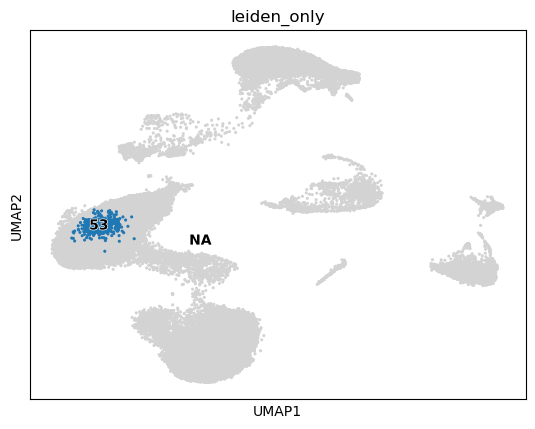

In [26]:
adata_result.obs['leiden_only'] = adata_result.obs['leiden'].astype(str)
adata_result.obs.loc[adata_result.obs['leiden'] != '53', 'leiden_only'] = None
sc.pl.umap(
    adata_result,
    color='leiden_only',
    legend_loc='on data',
    size=20,
    legend_fontsize=10,
    legend_fontoutline=1
)


In [27]:
import scanpy as sc

sc.tl.umap(adata_result)


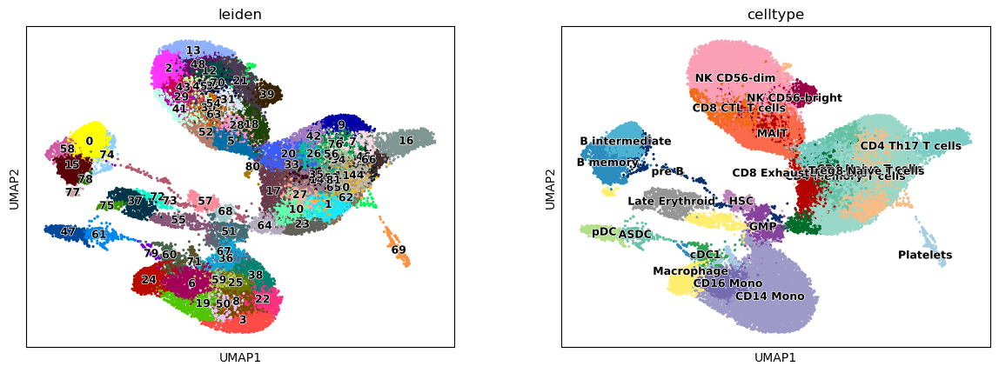

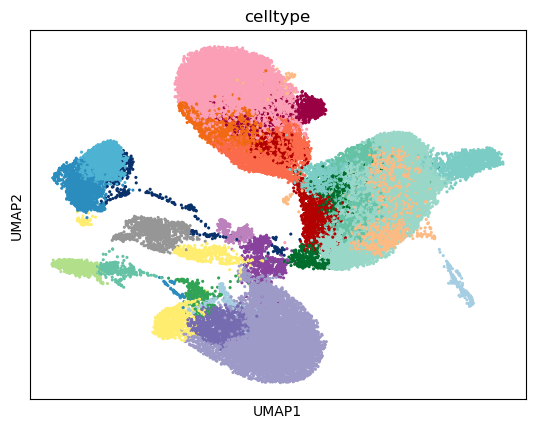

In [28]:
adata_result.uns['celltype_colors'] = [
    celltype_colors_dict.get(c, "#CCCCCC")  # 若未定义则灰色
    for c in adata_result.obs['celltype'].cat.categories
]

sc.pl.umap(
    adata_result,
    color=['leiden', 'celltype'],
    legend_loc='on data',
    size=20,                    # 点的大小
    legend_fontsize=9,         # 图例字体大小
    # save="_leiden_celltype.pdf",   # 文件名，自动保存在 ./figures/umap_leiden_celltype.pdf
    legend_fontoutline=1
)

# 2) celltype：不显示任何文字图例
sc.pl.umap(
    adata_result,
    color='celltype',
    legend_loc=None,
    size=20
)

In [29]:
adata

AnnData object with n_obs × n_vars = 103731 × 27390
    obs: 'prject', 'nUMI', 'nGene', 'cellID', 'Doublet_Score', 'Doublet_Class', 'log10GenesPerUMI', 'mitoRatio', 'riboRatio1', 'riboRatio2', 'riboRatio3', 'riboRatio4', 'riboRatio', 'RNA_snn_res.0', 'RNA_snn_res.0.1', 'RNA_snn_res.0.2', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.7', 'RNA_snn_res.0.8', 'RNA_snn_res.0.9', 'RNA_snn_res.1', 'seurat_clusters', 'class1', 'sample', 'source', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.1.2', 'RNA_snn_res.1.4', 'RNA_snn_res.1.6', 'RNA_snn_res.1.8', 'RNA_snn_res.2', 'cellType', 'dcellType', 'cell', 'patient', 'timing', 'category', 'response', 'sub.response', 'date', 'start', 'daysSinceStart', 'blast', 'age', 'sex', 'FAB', 'cellCount', 'monthsSinceStart', 'relapse', 'daysStartRelapse', 'monthsStartRelapse', 'mut', 'PT', 'NDRR'
    uns: 'neighbors'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    obsp: 'distances'

In [30]:
adata.obs['source'].value_counts()

source
1    54090
0    49641
Name: count, dtype: int64

2026-03-01 22:10:44,276 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2026-03-01 22:10:44,868 - harmonypy - INFO - sklearn.KMeans initialization complete.
2026-03-01 22:10:44,886 - harmonypy - INFO - Iteration 1 of 10
2026-03-01 22:10:45,576 - harmonypy - INFO - Iteration 2 of 10
2026-03-01 22:10:46,241 - harmonypy - INFO - Iteration 3 of 10
2026-03-01 22:10:46,922 - harmonypy - INFO - Iteration 4 of 10
2026-03-01 22:10:47,596 - harmonypy - INFO - Iteration 5 of 10
2026-03-01 22:10:48,274 - harmonypy - INFO - Iteration 6 of 10
2026-03-01 22:10:48,965 - harmonypy - INFO - Iteration 7 of 10
2026-03-01 22:10:49,659 - harmonypy - INFO - Iteration 8 of 10
2026-03-01 22:10:50,243 - harmonypy - INFO - Iteration 9 of 10
2026-03-01 22:10:50,925 - harmonypy - INFO - Iteration 10 of 10
2026-03-01 22:10:51,590 - harmonypy - INFO - Stopped before convergence


d:\Gaol\miniconda3\envs\geneformer_env\lib\site-packages\scanpy\tools\_rank_genes_groups.py:479: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
d:\Gaol\miniconda3\envs\geneformer_env\lib\site-packages\scanpy\tools\_rank_genes_groups.py:479: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
d:\Gaol\miniconda3\envs\geneformer_env\lib\site-packages\scanpy\tools\_rank_genes_groups.py:479: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
d:\Gaol\miniconda3\envs\geneformer_env\lib\site-packages\scanpy\tools\_rank_genes_groups.py:479: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
d:\Gaol\miniconda3\envs\geneformer_env\lib\site-packages\scanpy\tools\_rank_genes_groups.py:479: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (


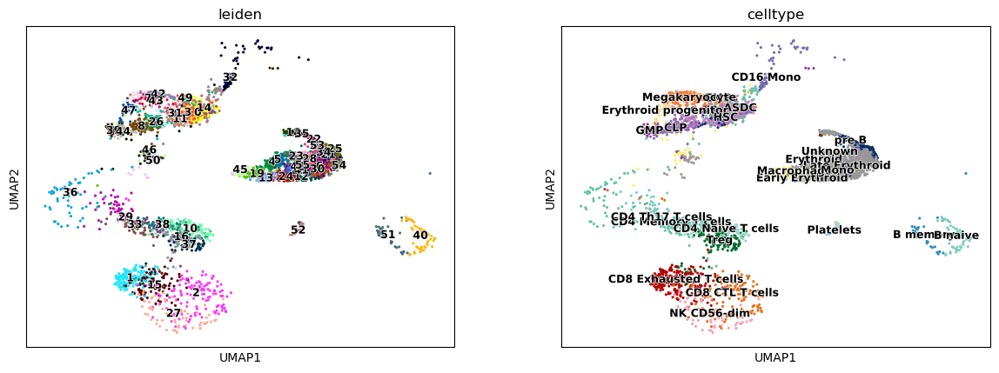

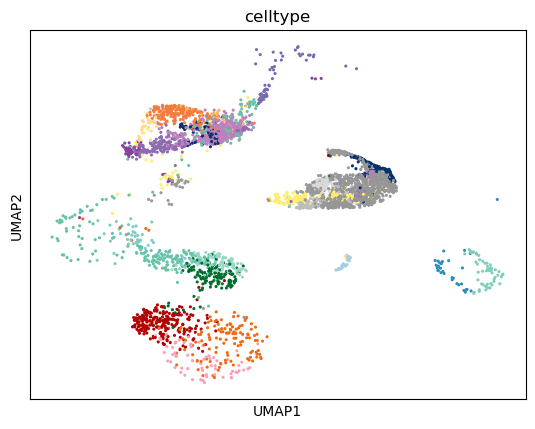

In [66]:
# 'patient' PT# single cell (old sample name) 22-27 HC -1 !!!!!
# 'source' 0 BM 1 PB
# "timing" 2 HC 0 pre 1 post
# 'response' 0 HC 1 responder 2 non responder
# "category" 0 ND 1 RR 2 HC
source = 0
category = 1
timing = 1
response = '2'
adata_filter = adata[
    (adata.obs['source'] == source) & (adata.obs['category'] == category) & (adata.obs['timing'] == timing) & (adata.obs['response'] == response)
].copy() # source PB category RR 
# adata_filter = adata[
#     (adata.obs['source'] == source) & (adata.obs['category'] == category ) 
# ].copy() # source PB category RR 
adata_filter.obs['patient'] = (
    adata_filter.obs['patient']
    .astype(str)        # 数字 -> 字符串
    .astype('category') # 再转成分类变量
)
# adata_filter = adata_aml
# response = 'nonresponder' #'responder''nonresponder'
# treatrment = 'pre'# 'pre' 'post'
# adata_filter = adata_aml[adata_aml.obs['treat'] == treatrment].copy()
# adata_filter = adata_filter[adata_filter.obs['venetoclax'] == response].copy()
embs="X_harmony" #"X_FTHCembedding_V1-10M", "X_FTembedding_V1-10M"
n_neighbors = 10
resolution =5 #PB 1
threshold_main = 0.1
threshold_sub = 0.1

adata_result, cluster_topN, topN_summary  = main_cluster(adata_filter, n_neighbors,embs, resolution,threshold_main,threshold_sub,celltype_colors_dict)

adata_result.uns['celltype_colors'] = [
    celltype_colors_dict.get(c, "#CCCCCC")  # 若未定义则灰色
    for c in adata_result.obs['celltype'].cat.categories
]

sc.pl.umap(
    adata_result,
    color=['leiden', 'celltype'],
    legend_loc='on data',
    size=20,                    # 点的大小
    legend_fontsize=9,         # 图例字体大小
    # save="_leiden_celltype.pdf",   # 文件名，自动保存在 ./figures/umap_leiden_celltype.pdf
    legend_fontoutline=1
)

# 2) celltype：不显示任何文字图例
sc.pl.umap(
    adata_result,
    color='celltype',
    legend_loc=None,
    size=20
)

In [68]:

# topN_summary.to_csv(f'topN_summary_{treatrment}_{response}.csv')
def get_cluster_proportions(adata, cluster_key='leiden'):
    s = adata.obs[cluster_key].astype('category').cat.remove_unused_categories()
    counts = s.value_counts()
    props  = (counts / counts.sum())
    out = pd.DataFrame({
        'n_cells': counts.sort_index(),
        'prop': props.sort_index(),
        'percent': (props.sort_index() * 100).round(2)
    })
    # 若类别名是数字字符串，按数值排序更直观
    try:
        out = out.sort_index(key=lambda idx: idx.astype(int))
    except Exception:
        pass
    return out

leiden_prop = get_cluster_proportions(adata_result, 'leiden')
# leiden_prop.to_csv(f'leiden_prop_source{source}_category{category}.csv')

topN_summary_sub = pd.DataFrame({
    k: {
        "lineage": v["lineage"][0],
        "lineage_score": v["lineage"][1],
        **{
            f"subtype_{i+1}": v["top_subtypes"][i][0] if len(v["top_subtypes"]) > i else None
            for i in range(3)
        },
        **{
            f"subtype_score_{i+1}": v["top_subtypes"][i][1] if len(v["top_subtypes"]) > i else None
            for i in range(3)
        }
    }
    for k, v in cluster_topN.items()
}).T
topN_summary_sub.to_csv(f'topN_summary_sub_source{source}_category{category}_timing{timing}_response{response}.csv')
# cross_tab = pd.crosstab(
#     adata_result.obs['leiden'],
#     adata_result.obs['celltype'],
#     normalize='index'
# ).round(3)

# cross_tab.to_csv(f'leiden_celltype_crosstab_source{source}_category{category}.csv')


In [ ]:
#PB
adata_result[adata_result.obs['leiden'].isin(['21'])].write("./adatas/PB/PB_HC_HSCLSC.h5ad")


adata_result[adata_result.obs['leiden'].isin(['3'])].write("./adatas/PB/PB_RR_pre_res_ASDC.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['22','20','15','14','12','5','7','25','26','27','30','32','34','41','47','52','44'])].write("./adatas/RR/RR_post_nres_Erythroid.h5ad")

# adata_result[adata_result.obs['leiden'].isin(['9', '0'])].write("./adatas/RR/RR_post_nres_ASDC.h5ad")
adata_result[adata_result.obs['leiden'].isin(['0','12'])].write("./adatas/PB/PB_RR_pre_nres_MPPpreB.h5ad")
adata_result[adata_result.obs['leiden'].isin(['13'])].write("./adatas/PB/PB_RR_pre_nres_HSCLSC.h5ad")
adata_result[adata_result.obs['leiden'].isin(['1','2'])].write("./adatas/PB/PB_RR_pre_nres_MPPCLP.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['2'])].write("./adatas/PB/PB_RR_pre_nres_Megakaryocyte.h5ad")
adata_result[adata_result.obs['leiden'].isin([ '8'])].write("./adatas/PB/PB_RR_pre_nres_progenitor.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['18', '21', '40'])].write("./adatas/RR/RR_post_nres_EMP.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['39'])].write("./adatas/RR/RR_post_nres_Macrophage1.h5ad")
adata_result[adata_result.obs['leiden'].isin(['10'])].write("./adatas/PB/PB_RR_pre_nres_LE.h5ad")
adata_result[adata_result.obs['leiden'].isin(['8'])].write("./adatas/PB/PB_RR_pre_nres_ASDC.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['22','20','15','14','12','5','7','25','26','27','30','32','34','41','47','52','44'])].write("./adatas/RR/RR_post_nres_Erythroid.h5ad")

# adata_result[adata_result.obs['leiden'].isin(['9', '0'])].write("./adatas/RR/RR_post_nres_ASDC.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['12'])].write("./adatas/PB/PB_RR_post_nres_MPPpreB.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['16', '1'])].write("./adatas/PB/PB_RR_post_nres_HSCLSC.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['0','3'])].write("./adatas/PB/PB_RR_post_nres_MPPCLP.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['2'])].write("./adatas/PB/PB_RR_post_nres_Megakaryocyte.h5ad")
# adata_result[adata_result.obs['leiden'].isin([ '13'])].write("./adatas/PB/PB_RR_post_nres_progenitor.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['18', '21', '40'])].write("./adatas/RR/RR_post_nres_EMP.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['39'])].write("./adatas/RR/RR_post_nres_Macrophage1.h5ad")
adata_result[adata_result.obs['leiden'].isin(['9'])].write("./adatas/PB/PB_RR_post_nres_LE.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['37'])].write("./adatas/PB/PB_RR_post_nres_GMP1.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['22','20','15','14','12','5','7','25','26','27','30','32','34','41','47','52','44'])].write("./adatas/RR/RR_post_nres_Erythroid.h5ad")

In [78]:
#BM
# adata_result[adata_result.obs['leiden'].isin(['21'])].write("./adatas/PB/PB_HC_HSCLSC.h5ad")


# adata_result[adata_result.obs['leiden'].isin(['1','6','7','13','30'])].write("./adatas/PB/BM_RR_pre_res_CLP.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['1','6','15'])].write("./adatas/PB/BM_RR_pre_res_Megakaryocyte.h5ad")
# adata_result[adata_result.obs['leiden'].isin( ['53'])].write("./adatas/PB/BM_RR_pre_res_progenitor.h5ad")
# adata_result[adata_result.obs['leiden'].isin( ['3','10','19','22','33','41'])].write("./adatas/PB/BM_RR_pre_res_MPPCLP.h5ad")
# adata_result[adata_result.obs['leiden'].isin( ['4','20','25','27','28'])].write("./adatas/PB/BM_RR_pre_res_HSCLSC.h5ad")

# adata_result[adata_result.obs['leiden'].isin(['0','12'])].write("./adatas/PB/PB_RR_pre_nres_MPPpreB.h5ad")
adata_result[adata_result.obs['leiden'].isin(['4','6','23','61'])].write("./adatas/PB/BM_RR_pre_nres_HSCLSC.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['1','2'])].write("./adatas/PB/PB_RR_pre_nres_MPPCLP.h5ad")
adata_result[adata_result.obs['leiden'].isin(['9','35'])].write("./adatas/PB/BM_RR_pre_nres_Megakaryocyte.h5ad")
adata_result[adata_result.obs['leiden'].isin([ '32'])].write("./adatas/PB/PB_RR_pre_nres_GMP.h5ad")
# # adata_result[adata_result.obs['leiden'].isin(['18', '21', '40'])].write("./adatas/RR/RR_post_nres_EMP.h5ad")
# # adata_result[adata_result.obs['leiden'].isin(['39'])].write("./adatas/RR/RR_post_nres_Macrophage1.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['10'])].write("./adatas/PB/PB_RR_pre_nres_LE.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['8'])].write("./adatas/PB/PB_RR_pre_nres_ASDC.h5ad")
# # adata_result[adata_result.obs['leiden'].isin(['22','20','15','14','12','5','7','25','26','27','30','32','34','41','47','52','44'])].write("./adatas/RR/RR_post_nres_Erythroid.h5ad")

# # adata_result[adata_result.obs['leiden'].isin(['9', '0'])].write("./adatas/RR/RR_post_nres_ASDC.h5ad")
# # adata_result[adata_result.obs['leiden'].isin(['12'])].write("./adatas/PB/PB_RR_post_nres_MPPpreB.h5ad")
adata_result[adata_result.obs['leiden'].isin(['0','3','11','26'])].write("./adatas/PB/BM_RR_post_nres_HSCLSC.h5ad")
adata_result[adata_result.obs['leiden'].isin(['22','25'])].write("./adatas/PB/BM_RR_post_nres_MPPCLP.h5ad")
adata_result[adata_result.obs['leiden'].isin(['42','43','49','7'])].write("./adatas/PB/BM_RR_post_nres_Megakaryocyte.h5ad")
adata_result[adata_result.obs['leiden'].isin([ '47'])].write("./adatas/PB/PB_RR_post_nres_progenitor.h5ad")
# # adata_result[adata_result.obs['leiden'].isin(['18', '21', '40'])].write("./adatas/RR/RR_post_nres_EMP.h5ad")
# # adata_result[adata_result.obs['leiden'].isin(['39'])].write("./adatas/RR/RR_post_nres_Macrophage1.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['9'])].write("./adatas/PB/PB_RR_post_nres_LE.h5ad")
# # adata_result[adata_result.obs['leiden'].isin(['37'])].write("./adatas/PB/PB_RR_post_nres_GMP1.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['22','20','15','14','12','5','7','25','26','27','30','32','34','41','47','52','44'])].write("./adatas/RR/RR_post_nres_Erythroid.h5ad")

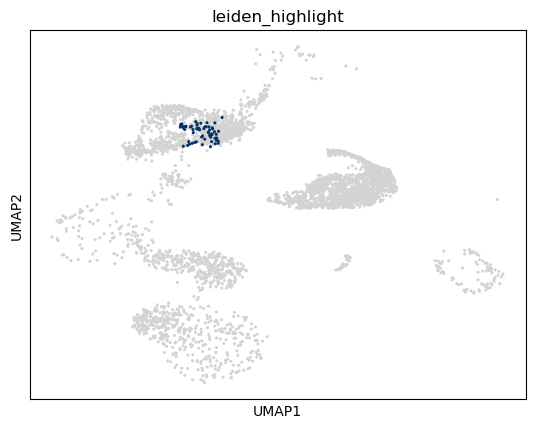

In [ ]:
# 1. 确保是字符串
adata_result.obs['leiden_only'] = adata_result.obs['leiden'].astype(str)

# 2. 要高亮的簇
highlight_clusters = ['22','25']# "Erythroid progenitor"

# 3. 合并成一个统一标签
adata_result.obs['leiden_highlight'] = None
adata_result.obs.loc[
    adata_result.obs['leiden_only'].isin(highlight_clusters),
    'leiden_highlight'
] = 'Highlighted clusters'

# 4. 画 UMAP（统一颜色）
sc.pl.umap(
    adata_result,
    color='leiden_highlight',
    # palette={'Highlighted clusters': '#fed98e'},  # "Erythroid progenitor"
    # palette={'Highlighted clusters': '#f47c3c'},  # Megakaryocyte"
    # palette={'Highlighted clusters': "#b2df8a"},  # "pDC"
    # "cDC1": "#31a354",
    # "cDC2": "#006d2c",
    # palette={"Highlighted clusters": "#08306b",},  # "PreB"
    # palette={"Highlighted clusters": "#bc80bd",},  # "HSC"
    palette={"Highlighted clusters": "#8c6bb1",},  # "CLP"
    # palette={"Highlighted clusters": "#ffed6f",},  # "Macrophage"
    # palette={"Highlighted clusters": "#110303",},  # "Late Erythroid"
    # palette={"Highlighted clusters": "#88419d"}, # "GMP":
    

    # "BFU_E": 
    # palette={"Highlighted clusters":"#e0ecf4", },                     # very early progenitor (pale blue-gray)
    # "CFU_E": 
    # palette={"Highlighted clusters":"#bfd3e6", },                     # committed progenitor (light blue)

    # "Proerythroblast_ProE": 
    # palette={"Highlighted clusters":"#9ebcda", },      # start terminal differentiation
    # "Basophilic_Erythroblast": 
    # palette={"Highlighted clusters":"#8c96c6", },   # early terminal
    # "Polychromatic_Erythroblast": 
    # palette={"Highlighted clusters":"#8c6bb1",}, # mid terminal (more purple)
    # "Orthochromatic_Erythroblast": 
    # palette={"Highlighted clusters":"#88419d",},# late terminal (deep purple)

    # "Reticulocyte":
    # palette={"Highlighted clusters": "#810f7c", },              # enucleated but immature (dark purple)
    # "RBC_Mature_Erythrocyte": 
    # palette={"Highlighted clusters":"#4d004b", },    # mature RBC (very dark purple)
    # "Erythroid": "#0b0a0a",
    # "Late Erythroid": "#110303",
    # palette={'Highlighted clusters': "#ffed6f"},  # "Macrophage"
    na_color='lightgrey',
    size=20,
    legend_loc=None,
    legend_fontsize=10,
    legend_fontoutline=1
)


AnnData object with n_obs × n_vars = 0 × 27390
    obs: 'prject', 'nUMI', 'nGene', 'cellID', 'Doublet_Score', 'Doublet_Class', 'log10GenesPerUMI', 'mitoRatio', 'riboRatio1', 'riboRatio2', 'riboRatio3', 'riboRatio4', 'riboRatio', 'RNA_snn_res.0', 'RNA_snn_res.0.1', 'RNA_snn_res.0.2', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.7', 'RNA_snn_res.0.8', 'RNA_snn_res.0.9', 'RNA_snn_res.1', 'seurat_clusters', 'class1', 'sample', 'source', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.1.2', 'RNA_snn_res.1.4', 'RNA_snn_res.1.6', 'RNA_snn_res.1.8', 'RNA_snn_res.2', 'cellType', 'dcellType', 'cell', 'patient', 'timing', 'category', 'response', 'sub.response', 'date', 'start', 'daysSinceStart', 'blast', 'age', 'sex', 'FAB', 'cellCount', 'monthsSinceStart', 'relapse', 'daysStartRelapse', 'monthsStartRelapse', 'mut', 'NDRR', 'PT'
    uns: 'neighbors'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    obsp: 'distances'

In [ ]:
# 'patient' PT# single cell (old sample name) 22-27 HC -1 !!!!!
# 'source' 0 BM 1 PB
# "timing" 2 HC 0 pre 1 post
# 'response' 0 HC 1 responder 2 non responder
# "category" 0 ND 1 RR 2 HC

# adata_filter = adata[
#     (adata.obs['source'] == 1) & (adata.obs['category'] == 1) & (adata.obs['timing'] == 1) & (adata.obs['response'] == '1')
# ].copy() # source PB category RR 
adata_filter = adata[
    (adata.obs['source'] == 1) & (adata.obs['category'] == 2) 
].copy() # source PB category RR 
adata_filter.obs['patient'] = (
    adata_filter.obs['patient']
    .astype(str)        # 数字 -> 字符串
    .astype('category') # 再转成分类变量
)
# adata_filter = adata_aml
# response = 'nonresponder' #'responder''nonresponder'
# treatrment = 'pre'# 'pre' 'post'
# adata_filter = adata_aml[adata_aml.obs['treat'] == treatrment].copy()
# adata_filter = adata_filter[adata_filter.obs['venetoclax'] == response].copy()
embs="X_harmony" #"X_FTHCembedding_V1-10M", "X_FTembedding_V1-10M"
n_neighbors = 10
resolution = 1 #除了pre-resp其他都用5
threshold_main = 0.1
threshold_sub = 0.1

adata_result, cluster_topN, topN_summary  = main_cluster(adata_filter, n_neighbors,embs, resolution,threshold_main,threshold_sub,celltype_colors_dict)

2026-02-19 10:20:08,991 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2026-02-19 10:20:10,857 - harmonypy - INFO - sklearn.KMeans initialization complete.
2026-02-19 10:20:10,963 - harmonypy - INFO - Iteration 1 of 10
2026-02-19 10:20:16,691 - harmonypy - INFO - Iteration 2 of 10
2026-02-19 10:20:22,521 - harmonypy - INFO - Iteration 3 of 10
2026-02-19 10:20:27,173 - harmonypy - INFO - Iteration 4 of 10
2026-02-19 10:20:28,889 - harmonypy - INFO - Converged after 4 iterations


C:\Users\abdul\AppData\Local\Temp\ipykernel_4392\3554219977.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata_filter.to_df().groupby(adata_filter.obs['leiden']).mean()


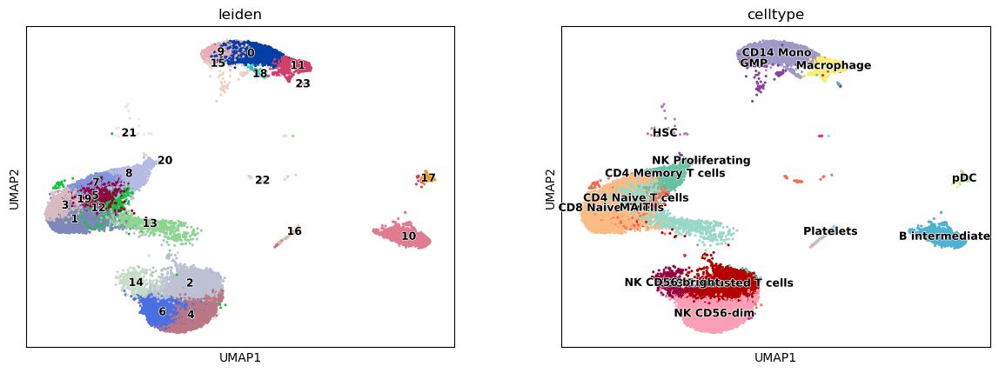

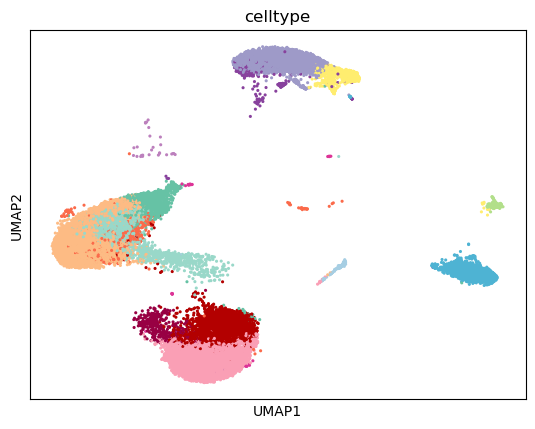

In [ ]:
adata_result.uns['celltype_colors'] = [
    celltype_colors_dict.get(c, "#CCCCCC")  # 若未定义则灰色
    for c in adata_result.obs['celltype'].cat.categories
]

sc.pl.umap(
    adata_result,
    color=['leiden', 'celltype'],
    legend_loc='on data',
    size=20,                    # 点的大小
    legend_fontsize=9,         # 图例字体大小
    # save="_leiden_celltype.pdf",   # 文件名，自动保存在 ./figures/umap_leiden_celltype.pdf
    legend_fontoutline=1
)

# 2) celltype：不显示任何文字图例
sc.pl.umap(
    adata_result,
    color='celltype',
    legend_loc=None,
    size=20
)

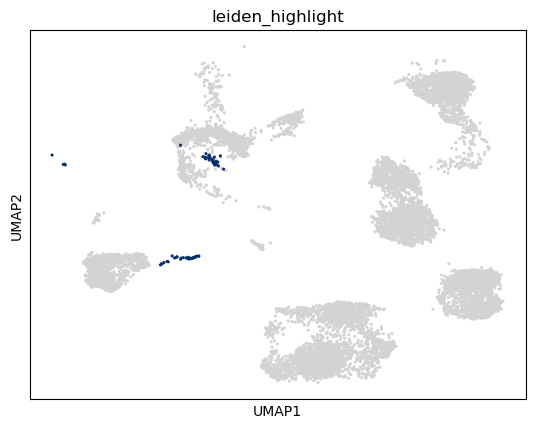

In [ ]:
# 1. 确保是字符串
adata_result.obs['leiden_only'] = adata_result.obs['leiden'].astype(str)

# 2. 要高亮的簇
highlight_clusters = ['51'] # "Erythroid progenitor"

# 3. 合并成一个统一标签
adata_result.obs['leiden_highlight'] = None
adata_result.obs.loc[
    adata_result.obs['leiden_only'].isin(highlight_clusters),
    'leiden_highlight'
] = 'Highlighted clusters'

# 4. 画 UMAP（统一颜色）
sc.pl.umap(
    adata_result,
    color='leiden_highlight',
    # palette={'Highlighted clusters': '#fed98e'},  # "Erythroid progenitor"
    # palette={'Highlighted clusters': '#f47c3c'},  # Megakaryocyte"
    # palette={'Highlighted clusters': "#b2df8a"},  # "pDC"
    # "cDC1": "#31a354",
    # "cDC2": "#006d2c",
    palette={"Highlighted clusters": "#08306b",},  # "PreB"
    # palette={"Highlighted clusters": "#bc80bd",},  # "HSC"
    # palette={"Highlighted clusters": "#8c6bb1",},  # "CLP"
    # palette={"Highlighted clusters": "#ffed6f",},  # "Macrophage"
    # palette={"Highlighted clusters": "#110303",},  # "Late Erythroid"
    # "GMP": "#88419d",
    # "Erythroid": "#0b0a0a",
    # "Late Erythroid": "#110303",
    # palette={'Highlighted clusters': "#ffed6f"},  # "Macrophage"
    na_color='lightgrey',
    size=20,
    legend_loc=None,
    legend_fontsize=10,
    legend_fontoutline=1
)


In [ ]:
# topN_summary.to_csv(f'topN_summary_{treatrment}_{response}.csv')
def get_cluster_proportions(adata, cluster_key='leiden'):
    s = adata.obs[cluster_key].astype('category').cat.remove_unused_categories()
    counts = s.value_counts()
    props  = (counts / counts.sum())
    out = pd.DataFrame({
        'n_cells': counts.sort_index(),
        'prop': props.sort_index(),
        'percent': (props.sort_index() * 100).round(2)
    })
    # 若类别名是数字字符串，按数值排序更直观
    try:
        out = out.sort_index(key=lambda idx: idx.astype(int))
    except Exception:
        pass
    return out

leiden_prop = get_cluster_proportions(adata_result, 'leiden')
leiden_prop.to_csv(f'leiden_prop_{treatrment}_{response}.csv')

topN_summary_sub = pd.DataFrame({
    k: {
        "lineage": v["lineage"][0],
        "lineage_score": v["lineage"][1],
        **{
            f"subtype_{i+1}": v["top_subtypes"][i][0] if len(v["top_subtypes"]) > i else None
            for i in range(3)
        },
        **{
            f"subtype_score_{i+1}": v["top_subtypes"][i][1] if len(v["top_subtypes"]) > i else None
            for i in range(3)
        }
    }
    for k, v in cluster_topN.items()
}).T
topN_summary_sub.to_csv(f'topN_summary_sub_{treatrment}_{response}.csv')
cross_tab = pd.crosstab(
    adata_result.obs['leiden'],
    adata_result.obs['celltype'],
    normalize='index'
).round(3)

cross_tab.to_csv(f'leiden_celltype_crosstab_{treatrment}_{response}.csv')


In [ ]:
genes = [
    "CDK6", "NRIP1", "MBD2", "JUND", "PRKN",
    "CALN1", "NKAIN2", "EEF1A1", "MACROD2",
    "NPDC1", "NPR3", "FLT3", "ERG"
]
genes = ['BCL2L1',"CALN1"
]

# gene = 'BCL2L1'

print(gene in adata.var_names)

import re

pattern = r"^CD.$"

akt_genes = adata.var_names[adata.var_names.str.match(pattern)]
akt_genes.tolist()

True


['CDA', 'CD2', 'CD6', 'CD5', 'CD9', 'CD4', 'CD7']

In [ ]:
mean_expr_dict = {}

for group_name, ad in adatas.items():
    # 保证基因都在 var_names 里
    genes_in_adata = [g for g in genes if g in ad.var_names]
    if len(genes_in_adata) == 0:
        continue

    # subset to genes
    ad_sub = ad[:, genes_in_adata]
    df = ad_sub.to_df()      # cells × genes

    # 每个基因在该组（所有细胞）的平均表达
    mean_expr = df.mean(axis=0)  # index=gene
    mean_expr_dict[group_name] = mean_expr

# 组合成一个大表：行=组，列=基因
mean_expr_df = pd.DataFrame(mean_expr_dict).T  # groups × genes
# 为了列顺序统一
mean_expr_df = mean_expr_df.reindex(columns=genes)

print(mean_expr_df.head())


           BCL2L1     CALN1
HC_EMP   0.134513  0.064036
HC_HSC   0.123354  0.142495
HC_NK    0.117613  0.000000
HC_GMP1  0.047345  0.010342
HC_cDC1  0.062549  0.003417


In [ ]:
mean_expr_df.to_csv('Konopleva_BCL2L1expression.csv')

In [ ]:
def get_condition(name: str) -> str:
    parts = name.split("_")
    if parts[0] == "HC":
        return "HC"
    # pre_res_EMP / post_nres_GMP 这类
    return "_".join(parts[:2])

def get_celltype(name: str) -> str:
    parts = name.split("_")
    if parts[0] == "HC":
        ct = "_".join(parts[1:])     # EMP / macrophage
    else:
        ct = "_".join(parts[2:])     # EMP / GMP / preB / ASDC
    return ct.lower()                

cond2groups = {}
ct2groups = {}

for g in adatas.keys():
    cond = get_condition(g)
    ct = get_celltype(g)

    cond2groups.setdefault(cond, []).append(g)
    ct2groups.setdefault(ct, []).append(g)

print("cond2groups:", cond2groups.keys())
print("ct2groups:", ct2groups.keys())


cond2groups: dict_keys(['HC', 'pre_res', 'pre_nres', 'post_res', 'post_nres'])
ct2groups: dict_keys(['emp', 'hsc', 'nk', 'gmp1', 'cdc1', 'macrophage3', 'erythroid(right)', 'mppclp1', 'hsclsc', 'mppclp2', 'le', 'gmp2', 'macrophage2', 'asdc', 'mpppreb', 'macrophage1'])


In [ ]:
ct2groups={
    "emp": [
        "HC_EMP",
        "pre_res_EMP",
        "pre_nres_EMP",
        "post_res_EMP",
        "post_nres_EMP",
    ],

    "gmp1": [
        "HC_cDC1",
        "HC_GMP1",
        "pre_res_GMP1",
        "post_res_GMP1",
        "post_nres_GMP1",
    ],

    "mppclp1": [
        "pre_res_GMP2",
        "pre_res_MPPCLP1",
        "pre_nres_MPPCLP1",
        "post_nres_ASDC",
        "post_nres_MPPpreB",
        "post_nres_MPPCLP1",
    ],

    "hsclsc": [
        "HC_HSC",
        "pre_res_HSCLSC",
        "pre_nres_HSCLSC",
        "post_nres_HSCLSC",
    ],

    "Late Erythroid(left)": [
        "HC_NK",
        "pre_res_MPPCLP2",
        "pre_res_LE",
        "pre_nres_LE",
        "post_res_LE",
        "post_nres_LE",
        "post_nres_Macrophage1",
    ],

    "macrophage": [
        "HC_macrophage3",
        "pre_res_macrophage2",
        "post_nres_Macrophage1",
    ],
}


In [ ]:
cond2groups

{'HC': ['HC_EMP',
  'HC_HSC',
  'HC_NK',
  'HC_GMP1',
  'HC_cDC1',
  'HC_macrophage3',
  'HC_Erythroid(right)'],
 'pre_res': ['pre_res_MPPCLP1',
  'pre_res_HSCLSC',
  'pre_res_EMP',
  'pre_res_MPPCLP2',
  'pre_res_LE',
  'pre_res_GMP1',
  'pre_res_GMP2',
  'pre_res_macrophage2',
  'pre_res_Erythroid(right)'],
 'pre_nres': ['pre_nres_HSCLSC',
  'pre_nres_MPPCLP1',
  'pre_nres_EMP',
  'pre_nres_LE',
  'pre_nres_Erythroid(right)'],
 'post_res': ['post_res_EMP',
  'post_res_LE',
  'post_res_GMP1',
  'post_res_Erythroid(right)'],
 'post_nres': ['post_nres_ASDC',
  'post_nres_MPPpreB',
  'post_nres_HSCLSC',
  'post_nres_MPPCLP1',
  'post_nres_EMP',
  'post_nres_Macrophage1',
  'post_nres_LE',
  'post_nres_GMP1',
  'post_nres_Erythroid(right)']}

In [ ]:


# =========================
# Utils
# =========================

def pct_expressed(ad, groupby, group, threshold=0):
    obs_vals = ad.obs[groupby].astype(str).values
    group = str(group)
    idx = (obs_vals == group)
    n = int(idx.sum())
    if n == 0:
        return np.zeros(ad.n_vars, dtype=float)

    X = ad.X[idx]
    if sp.issparse(X):
        return np.asarray((X > threshold).mean(axis=0)).ravel()
    else:
        return (X > threshold).mean(axis=0)

def safe_concat_many(ad_list, labels, key):
    safe = [f"s{i}" for i in range(len(ad_list))]
    ad_all = ad_list[0].concatenate(
        *ad_list[1:],
        batch_key=key,
        batch_categories=safe,
        index_unique=None
    )
    mapper = dict(zip(safe, labels))
    ad_all.obs[key] = ad_all.obs[key].astype(str).map(mapper).astype("category")
    return ad_all

def safe_concat_two(ad1, ad2, label1, label2, key, genes_use=None):
    if genes_use is not None:
        ad1 = ad1[:, genes_use]
        ad2 = ad2[:, genes_use]
    ad = ad1.concatenate(
        ad2,
        batch_key=key,
        batch_categories=["s0", "s1"],
        index_unique=None
    )
    ad.obs[key] = ad.obs[key].astype(str).map({"s0": label1, "s1": label2}).astype("category")
    return ad

# =========================
# (A) Axis1: within condition, across cell types
# =========================

# ---- 1) 预计算：每个 condition 一套 HVG（只算一次）----
cond_hvgs = {}
for cond, groups in cond2groups.items():
    if len(groups) < 2:
        continue

    ad_list = [adatas[g] for g in groups]
    ad_all = safe_concat_many(ad_list, labels=groups, key="cell_type")

    sc.pp.filter_genes(ad_all, min_cells=max(3, int(0.01 * ad_all.n_obs)))

    sc.pp.highly_variable_genes(
        ad_all,
        n_top_genes=2000,
        flavor="cell_ranger",
        n_bins=10
    )
    cond_hvgs[cond] = ad_all.var_names[ad_all.var["highly_variable"]].tolist()

print("Prepared HVGs for conditions:", {k: len(v) for k, v in cond_hvgs.items()})


# ---- 2) Axis1 pairwise DE：同一 condition 内两两 cell type 比较（只用该 condition HVG）----
axis1_results = []
c1 = 0
skipped1 = []

MIN_CELLS_PER_GROUP = 10
MIN_GENES_USE = 200

for cond, groups in cond2groups.items():
    if len(groups) < 2:
        continue

    hvg = cond_hvgs.get(cond, None)
    if not hvg:
        continue

    for g1, g2 in combinations(groups, 2):
        ad1 = adatas[g1]
        ad2 = adatas[g2]

        genes_use = [x for x in hvg if (x in ad1.var_names and x in ad2.var_names)]
        if len(genes_use) < MIN_GENES_USE:
            skipped1.append((cond, g1, g2, "too_few_genes_use", len(genes_use)))
            continue

        ad = safe_concat_two(ad1, ad2, label1=g1, label2=g2, key="cell_type", genes_use=genes_use)

        # ---- sanity check 1：两组细胞数是否足够 ----
        vc = ad.obs["cell_type"].astype(str).value_counts().to_dict()
        n1 = int(vc.get(g1, 0))
        n2 = int(vc.get(g2, 0))
        if n1 < MIN_CELLS_PER_GROUP or n2 < MIN_CELLS_PER_GROUP:
            skipped1.append((cond, g1, g2, "too_few_cells", (n1, n2)))
            continue

        # ---- sanity check 2：去掉两组都全 0 的基因（避免 stats=None）----
        pts_1_tmp = pct_expressed(ad, "cell_type", g1)
        pts_2_tmp = pct_expressed(ad, "cell_type", g2)
        keep = (pts_1_tmp > 0) | (pts_2_tmp > 0)
        if int(keep.sum()) < MIN_GENES_USE:
            skipped1.append((cond, g1, g2, "all_zero_or_constant_genes", int(keep.sum())))
            continue

        ad2s = ad[:, keep].copy()

        # ---- DE：try/except 保底 ----
        try:
            sc.tl.rank_genes_groups(
                ad2s,
                groupby="cell_type",
                groups=[g1],
                reference=g2,
                method="wilcoxon",
                n_genes=min(ad2s.n_vars, 3000),
            )
        except Exception as e:
            skipped1.append((cond, g1, g2, "rank_genes_groups_failed", repr(e)))
            continue

        # pts / pts_rest（基于 ad2s）
        pts_g1 = pct_expressed(ad2s, "cell_type", g1)
        pts_g2 = pct_expressed(ad2s, "cell_type", g2)

        df = sc.get.rank_genes_groups_df(ad2s, group=g1).copy()
        df["axis"] = "within_condition_celltype"
        df["condition"] = cond
        df["celltype_1"] = g1
        df["celltype_2"] = g2
        df["n_hvg_used"] = int(ad2s.n_vars)
        df["n_cells_c1"] = n1
        df["n_cells_c2"] = n2

        idx_gene = ad2s.var_names.get_indexer(df["names"])
        ok = idx_gene >= 0
        df = df.loc[ok].copy()
        idx_gene = idx_gene[ok]

        df["pts"] = pts_g1[idx_gene]
        df["pts_rest"] = pts_g2[idx_gene]

        axis1_results.append(df)
        c1 += 1

axis1_deg = pd.concat(axis1_results, ignore_index=True) if len(axis1_results) else pd.DataFrame()
print("Axis1 comparisons:", c1, "Axis1 DEG rows:", axis1_deg.shape)

# 可选：查看 Axis1 跳过原因
skipped1_df = pd.DataFrame(skipped1, columns=["condition", "g1", "g2", "reason", "detail"])
print(skipped1_df["reason"].value_counts())
# skipped1_df.to_csv("axis1_skipped_pairs.csv", index=False)


C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:21: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad_all = ad_list[0].concatenate(
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:21: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad_all = ad_list[0].concatenate(
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:21: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad_all = ad_list[0].concatenate(
C:\Users\abdul\A

Prepared HVGs for conditions: {'HC': 2000, 'pre_res': 2000, 'pre_nres': 2000, 'post_res': 2000, 'post_nres': 2000}


C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:35: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad = ad1.concatenate(
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:35: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad = ad1.concatenate(
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:35: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad = ad1.concatenate(
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\

Axis1 comparisons: 109 Axis1 DEG rows: (211924, 14)
Series([], Name: count, dtype: int64)


C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:35: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad = ad1.concatenate(


In [ ]:
print(c1) 

P_CUT   = 0.01
LFC_CUT = 0.5
PTS_DELTA = 0.10
PTS_MIN   = 0.10

df = axis1_deg.replace([np.inf, -np.inf], np.nan).dropna(subset=["pvals_adj","logfoldchanges","names"]).copy()

# rank_genes_groups_df 通常含 pts/pts_rest（若没有就看第2条的做法）
need_cols = ["pts", "pts_rest"]
missing = [c for c in need_cols if c not in df.columns]
if missing:
    print("Missing columns:", missing, "→ 看下面第2条：在 rank_genes_groups 时启用 pts 计算/或自己算。")

axis1_deg_filt = df.query(
    "pvals_adj < @P_CUT and abs(logfoldchanges) > @LFC_CUT"
).copy()

# pct filters（如果 pts/pts_rest 存在）
if "pts" in axis1_deg_filt.columns and "pts_rest" in axis1_deg_filt.columns:
    axis1_deg_filt = axis1_deg_filt[
        ((axis1_deg_filt["pts"] - axis1_deg_filt["pts_rest"]).abs() >= PTS_DELTA) &
        (axis1_deg_filt[["pts","pts_rest"]].max(axis=1) >= PTS_MIN)
    ].copy()



print(axis1_deg_filt.shape)
axis1_deg_filt.to_csv('same_condition_deg_filt.csv')
# axis1_deg_filt.head()
axis1_deg_filt

109
(34218, 14)


,names,scores,logfoldchanges,pvals,pvals_adj,axis,condition,celltype_1,celltype_2,n_hvg_used,n_cells_c1,n_cells_c2,pts,pts_rest
0,FCER1A,5.254657,2.561960,1.483004e-07,4.646747e-06,within_condition_celltype,HC,HC_EMP,HC_HSC,1974,164,242,0.408537,0.119835
1,PLEK,4.787931,1.979276,1.685096e-06,4.376816e-05,within_condition_celltype,HC,HC_EMP,HC_HSC,1974,164,242,0.451220,0.219008
2,CNRIP1,4.595724,4.188721,4.312489e-06,1.038153e-04,within_condition_celltype,HC,HC_EMP,HC_HSC,1974,164,242,0.286585,0.016529
3,CD7,4.384555,2.734056,1.162230e-05,2.637059e-04,within_condition_celltype,HC,HC_EMP,HC_HSC,1974,164,242,0.323171,0.074380
4,CPA3,4.271645,2.859554,1.940367e-05,4.209103e-04,within_condition_celltype,HC,HC_EMP,HC_HSC,1974,164,242,0.317073,0.082645
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211919,SLC4A1,-10.224265,-33.386097,1.543946e-24,3.859864e-22,within_condition_celltype,post_nres,post_nres_GMP1,post_nres_Erythroid(right),2000,55,1505,0.000000,0.810631
211920,SLC25A37,-10.895776,-7.581127,1.207338e-27,4.024461e-25,within_condition_celltype,post_nres,post_nres_GMP1,post_nres_Erythroid(right),2000,55,1505,0.090909,0.878405
211921,HBA1,-11.014017,-9.648964,3.270867e-28,1.308347e-25,within_condition_celltype,post_nres,post_nres_GMP1,post_nres_Erythroid(right),2000,55,1505,0.072727,0.884385
211922,HBA2,-11.062015,-10.370000,1.917412e-28,9.587059e-26,within_condition_celltype,post_nres,post_nres_GMP1,post_nres_Erythroid(right),2000,55,1505,0.072727,0.886379


In [ ]:
axis2_results = []
c2 = 0
skipped = []

MIN_CELLS_PER_GROUP = 10   # 你可以改成 5/20
MIN_GENES_USE = 200        # 你原来是 200

for ct, groups in ct2groups.items():
    if len(groups) < 2:
        continue

    hvg = ct_hvgs.get(ct, None)
    if not hvg:
        continue

    for g1, g2 in combinations(groups, 2):
        ad1 = adatas[g1]
        ad2 = adatas[g2]

        cond1 = g1.rsplit("_", 1)[0]
        cond2 = g2.rsplit("_", 1)[0]

        # 取交集
        genes_use = [x for x in hvg if (x in ad1.var_names and x in ad2.var_names)]
        if len(genes_use) < MIN_GENES_USE:
            skipped.append((ct, g1, g2, "too_few_genes_use", len(genes_use)))
            continue

        # 安全 concat
        ad = safe_concat_two(ad1, ad2, label1=cond1, label2=cond2, key="condition", genes_use=genes_use)

        # ---- 关键 sanity check 1：两组细胞数是否足够 ----
        vc = ad.obs["condition"].astype(str).value_counts().to_dict()
        n1 = int(vc.get(cond1, 0))
        n2 = int(vc.get(cond2, 0))
        if n1 < MIN_CELLS_PER_GROUP or n2 < MIN_CELLS_PER_GROUP:
            skipped.append((ct, g1, g2, "too_few_cells", (n1, n2)))
            continue

        # ---- 关键 sanity check 2：去掉在两组都全 0 的基因（否则统计可能为空）----
        # 这里用 pct_expressed 快速判断两组都不表达的基因
        pts_c1_tmp = pct_expressed(ad, "condition", cond1)
        pts_c2_tmp = pct_expressed(ad, "condition", cond2)
        keep = (pts_c1_tmp > 0) | (pts_c2_tmp > 0)
        if int(keep.sum()) < MIN_GENES_USE:
            skipped.append((ct, g1, g2, "all_zero_or_constant_genes", int(keep.sum())))
            continue

        # subset 到保留基因再跑 DE（避免 scanpy 内部 stats=None）
        ad2s = ad[:, keep].copy()

        # ---- 关键 sanity check 3：每组至少有一些表达变化（可选，但很有效）----
        # 如果你发现仍然会炸，可以开启下面这一段：检查是否存在非零基因方差
        # if sp.issparse(ad2s.X):
        #     # 粗略：检查每个基因是否至少在任一组出现过非零（已经保证），通常够了
        #     pass

        # 跑 DE（用 try/except 保底）
        try:
            sc.tl.rank_genes_groups(
                ad2s,
                groupby="condition",
                groups=[cond1],
                reference=cond2,
                method="wilcoxon",
                n_genes=min(ad2s.n_vars, 3000),   # 避免 n_genes > n_vars
            )
        except Exception as e:
            skipped.append((ct, g1, g2, "rank_genes_groups_failed", repr(e)))
            continue

        # 重新计算 pts（基于 ad2s 的基因集合）
        pts_c1 = pct_expressed(ad2s, "condition", cond1)
        pts_c2 = pct_expressed(ad2s, "condition", cond2)

        df = sc.get.rank_genes_groups_df(ad2s, group=cond1).copy()
        df["axis"] = "within_celltype_condition"
        df["cell_type"] = ct
        df["condition_1"] = cond1
        df["condition_2"] = cond2
        df["n_hvg_used"] = int(ad2s.n_vars)
        df["n_cells_c1"] = n1
        df["n_cells_c2"] = n2

        idx_gene = ad2s.var_names.get_indexer(df["names"])
        ok = idx_gene >= 0
        df = df.loc[ok].copy()
        idx_gene = idx_gene[ok]

        df["pts"] = pts_c1[idx_gene]
        df["pts_rest"] = pts_c2[idx_gene]

        axis2_results.append(df)
        c2 += 1

axis2_deg = pd.concat(axis2_results, ignore_index=True) if len(axis2_results) else pd.DataFrame()
print("Axis2 comparisons:", c2, "Axis2 DEG rows:", axis2_deg.shape)

# 可选：查看跳过了哪些 pair（强烈建议先看一眼）
skipped_df = pd.DataFrame(skipped, columns=["cell_type_group", "g1", "g2", "reason", "detail"])
print(skipped_df["reason"].value_counts())
# skipped_df.to_csv("axis2_skipped_pairs.csv", index=False)


C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:35: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad = ad1.concatenate(
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:35: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad = ad1.concatenate(
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:35: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad = ad1.concatenate(
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\

Axis2 comparisons: 58 Axis2 DEG rows: (112799, 14)
reason
rank_genes_groups_failed    7
Name: count, dtype: int64


C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:35: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad = ad1.concatenate(


In [ ]:
print(c2)
P_CUT = 0.01
LFC_CUT = 0.5   # 单细胞常用 0.25（也有人用 0.5）

axis2_deg_filt = (
    axis2_deg
    .replace([np.inf, -np.inf], np.nan)
    .dropna(subset=["pvals_adj", "logfoldchanges", "names"])
    .query("pvals_adj < @P_CUT and abs(logfoldchanges) > @LFC_CUT")
    .copy()
)

print(axis2_deg_filt.shape)
axis2_deg_filt.to_csv('same_location_deg_filt.csv')
axis2_deg_filt

58
(14200, 14)


,names,scores,logfoldchanges,pvals,pvals_adj,axis,cell_type,condition_1,condition_2,n_hvg_used,n_cells_c1,n_cells_c2,pts,pts_rest
0,GAPDH,16.187082,4.210207,6.220876e-59,1.234844e-55,within_celltype_condition,emp,HC,pre_res,1985,164,433,0.939024,0.408776
1,FAU,14.464476,3.249370,2.031466e-47,1.344153e-44,within_celltype_condition,emp,HC,pre_res,1985,164,433,0.896341,0.487298
2,FOSB,14.391117,3.139970,5.883801e-47,2.919836e-44,within_celltype_condition,emp,HC,pre_res,1985,164,433,0.963415,0.563510
3,PPIA,14.369322,3.306820,8.061680e-47,3.200487e-44,within_celltype_condition,emp,HC,pre_res,1985,164,433,0.884146,0.418014
4,TSC22D3,14.168914,3.511287,1.426909e-45,4.046306e-43,within_celltype_condition,emp,HC,pre_res,1985,164,433,0.908537,0.431871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112794,CA1,-4.633931,-8.997187,3.587860e-06,1.367703e-04,within_celltype_condition,macrophage,pre_res,post_nres,1977,189,52,0.005291,0.423077
112795,SLC4A1,-4.669871,-31.374399,3.013894e-06,1.216014e-04,within_celltype_condition,macrophage,pre_res,post_nres,1977,189,52,0.000000,0.423077
112796,HBB,-5.000063,-6.042389,5.731141e-07,3.062288e-05,within_celltype_condition,macrophage,pre_res,post_nres,1977,189,52,0.185185,0.538462
112797,NFIA,-5.239285,-7.646849,1.612000e-07,9.959136e-06,within_celltype_condition,macrophage,pre_res,post_nres,1977,189,52,0.010582,0.480769


In [ ]:



axis1_results = []

for cond, groups in cond2groups.items():  # cond = pre_res / pre_nres / post_res ...
    if len(groups) < 2:
        continue

    for g1, g2 in combinations(groups, 2):
        ad1 = adatas[g1]
        ad2 = adatas[g2]

        ad = ad1.concatenate(
            ad2,
            batch_key="cell_type",
            batch_categories=[g1, g2],
            index_unique=None
        )

        sc.tl.rank_genes_groups(
            ad,
            groupby="cell_type",
            groups=[g1],
            reference=g2,
            method="wilcoxon"
        )

        df = sc.get.rank_genes_groups_df(ad, group=g1)
        df["axis"] = "within_condition_celltype"
        df["condition"] = cond
        df["celltype_1"] = g1
        df["celltype_2"] = g2

        axis1_results.append(df)

axis1_deg = pd.concat(axis1_results, ignore_index=True)


In [ ]:
pattern_expr =mean_expr_df.copy()
for col in range(mean_expr_df.shape[1]):
    average = np.mean(mean_expr_df.iloc[:,col])
    for row in range(mean_expr_df.shape[0]):
        # if mean_expr_df.iloc[row,col]>average:
        #     pattern_expr.iloc[row,col] =  '>'
        # elif mean_expr_df.iloc[row,col]<average:
        #     pattern_expr.iloc[row,col] =  '<'
        pattern_expr.iloc[row,col] =  mean_expr_df.iloc[row,col] /average
pattern_expr.to_csv('pattern_expr.csv')



In [ ]:
rows = []
groups = mean_expr_df.index.tolist()

for gene in genes:
    for g1, g2 in combinations(groups, 2):
        v1 = mean_expr_df.loc[g1, gene]
        v2 = mean_expr_df.loc[g2, gene]

        rows.append({
            "gene": gene,
            "group1": g1,
            "group2": g2,
            "mean_expr_group1": v1,
            "mean_expr_group2": v2,
            "mean_diff": v1 - v2,
            "abs_mean_diff": abs(v1 - v2),  # 这个越小越“相似”
        })

pairwise_gene_df = pd.DataFrame(rows)
print(pairwise_gene_df.head())


   gene group1     group2  mean_expr_group1  mean_expr_group2  mean_diff  \
0  CDK6   HC_C       HC_A          1.242525          0.063787   1.178737   
1  CDK6   HC_C       HC_B          1.242525          1.062995   0.179530   
2  CDK6   HC_C       HC_E          1.242525          0.349910   0.892615   
3  CDK6   HC_C       HC_F          1.242525          0.338023   0.904502   
4  CDK6   HC_C  pre_res_A          1.242525          2.292438  -1.049913   

   abs_mean_diff  
0       1.178737  
1       0.179530  
2       0.892615  
3       0.904502  
4       1.049913  


In [ ]:
import numpy as np
from scipy.stats import mannwhitneyu
import scipy.sparse as sp
import pandas as pd

def get_gene_values(ad, gene):
    # 基因不存在就返回 None
    if gene not in ad.var_names:
        return None

    # 找到该基因的列索引
    idx = np.where(ad.var_names == gene)[0][0]

    # 提取这一列表达
    if sp.issparse(ad.X):
        vals = ad.X[:, idx].toarray().ravel()  # (n_cells, 1) -> (n_cells,)
    else:
        vals = np.asarray(ad.X[:, idx]).ravel()

    # 转 float，去 NaN
    vals = vals.astype(float)
    vals = vals[~np.isnan(vals)]

    # 也可以顺手去掉 inf（保险起见）
    vals = vals[np.isfinite(vals)]

    if vals.size == 0:
        return None
    return vals


rows = []
group_names = list(adatas.keys())

for gene in genes:
    for g1, g2 in combinations(group_names, 2):
        x = get_gene_values(adatas[g1], gene)
        y = get_gene_values(adatas[g2], gene)

        # 有一边没有数据就跳过
        if x is None or y is None:
            continue

        # Mann-Whitney U test
        stat, p = mannwhitneyu(x, y, alternative="two-sided")

        rows.append({
            "gene": gene,
            "group1": g1,
            "group2": g2,
            "n1": len(x),
            "n2": len(y),
            "p_value": p
        })

stats_df = pd.DataFrame(rows)
print(stats_df.head())


   gene group1 group2   n1    n2       p_value
0  CDK6   HC_C   HC_A  141    23  2.272264e-08
1  CDK6   HC_C   HC_B  141   242  6.902405e-03
2  CDK6   HC_C   HC_E  141    78  8.261088e-12
3  CDK6   HC_C   HC_F  141   629  1.720749e-34
4  CDK6   HC_C  pre_A  141  1059  2.290140e-34


In [ ]:
stats_df

,gene,group1,group2,n1,n2,p_value
0,CDK6,HC_C,HC_A,141,23,2.272264e-08
1,CDK6,HC_C,HC_B,141,242,6.902405e-03
2,CDK6,HC_C,HC_E,141,78,8.261088e-12
3,CDK6,HC_C,HC_F,141,629,1.720749e-34
4,CDK6,HC_C,pre_A,141,1059,2.290140e-34
...,...,...,...,...,...,...
2465,ERG,nres_C,nres_E,215,73,1.799917e-19
2466,ERG,nres_C,nres_F,215,55,9.070788e-14
2467,ERG,nres_D,nres_E,52,73,2.498758e-03
2468,ERG,nres_D,nres_F,52,55,1.472709e-01


In [ ]:
# 合并 mean_diff 和 p值信息
merged_df = pairwise_gene_df.merge(
    stats_df,
    on=["gene", "group1", "group2"],
    how="left"
)


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def make_matrix(df, gene, value_col, groups):
    """
    df: merged df
    gene: 基因
    value_col: 'abs_mean_diff' or 'p_value'
    groups: 所有 group 的名字
    """
    mat = pd.DataFrame(np.nan, index=groups, columns=groups)

    sub = df[df["gene"] == gene]

    for _, row in sub.iterrows():
        g1, g2 = row["group1"], row["group2"]
        mat.loc[g1, g2] = row[value_col]
        mat.loc[g2, g1] = row[value_col]   # 对称填充

    np.fill_diagonal(mat.values, 0)
    return mat


In [ ]:
import os

os.makedirs("gene_heatmaps", exist_ok=True)

groups = mean_expr_df.index.tolist()

for gene in genes:
    # --- 1) mean_diff 热图 (绝对值越小越相似) ---
    mat_diff = make_matrix(merged_df, gene, "abs_mean_diff", groups)

    plt.figure(figsize=(10, 8))
    sns.heatmap(mat_diff, annot=False, cmap="viridis")··························
    plt.savefig(f"gene_heatmaps/{gene}_mean_diff_heatmap.png")
    plt.close()

    # --- 2) p-value 热图 ---
    mat_p = make_matrix(merged_df, gene, "p_value", groups)

    # plt.figure(figsize=(10, 8))
    # sns.heatmap(mat_p, annot=False, cmap="rocket_r", norm=plt.matplotlib.colors.LogNorm())
    # plt.title(f"{gene} - Mann-Whitney P-value")
    # plt.tight_layout()
    # plt.savefig(f"gene_heatmaps/{gene}_pvalue_heatmap.png")
    # plt.close()
    mat_p_capped = mat_p.clip(upper=0.05)

    plt.figure(figsize=(10, 8))
    ax = sns.heatmap(mat_p_capped, cmap="rocket_r", vmin=0, vmax=0.05)

    cbar = ax.collections[0].colorbar
    cbar.set_ticks([0.05, 0.01, 0.001])
    cbar.set_ticklabels(['0.05', '0.01', '0.001'])

    plt.title(f"{gene} - P-value (capped at 0.05)")
    plt.tight_layout()
    plt.savefig(f"gene_heatmaps/{gene}_pvalue_heatmap.png")
    plt.close()

print("完成！所有热图已保存到 gene_heatmaps/ 文件夹。")


完成！所有热图已保存到 gene_heatmaps/ 文件夹。


In [ ]:
mean_expression = {}

for name, adata in adatas.items():
    # 转为 dense array（如果是 sparse）
    X = adata.X.toarray() if hasattr(adata.X, "toarray") else adata.X
    
    mean_vec = np.asarray(X.mean(axis=0))
    
    mean_expression[name] = pd.Series(mean_vec, index=adata.var_names)


In [ ]:
df = pd.DataFrame(mean_expression)
df.head()


,HC_A,HC_B,HC_C,pre_A,pre_B,pre_C,pre_D,res_C,nres_A,nres_B,nres_C,nres_D
AL627309.1,0.000000,0.003548,0.007915,0.006013,0.022039,0.024533,0.000000,0.000000,0.005786,0.000000,0.007680,0.000000
AL627309.5,0.024743,0.022180,0.028006,0.008743,0.018496,0.011501,0.010239,0.037405,0.053606,0.016124,0.045197,0.000000
LINC01409,0.013390,0.008667,0.016567,0.086442,0.045912,0.068458,0.051184,0.038920,0.058896,0.037026,0.080604,0.000000
LINC01128,0.028365,0.141670,0.053965,0.043731,0.092764,0.059822,0.065877,0.086661,0.082633,0.115493,0.110427,0.033590
LINC00115,0.045647,0.011533,0.029909,0.009147,0.021503,0.018810,0.000000,0.000000,0.031543,0.010087,0.010149,0.039846


In [ ]:
sim_spearman = df.corr(method="spearman")
sim_pearson = df.corr(method="pearson")
from sklearn.metrics.pairwise import cosine_similarity

sim_cosine = pd.DataFrame(
    cosine_similarity(df.T),
    index=df.columns,
    columns=df.columns
)

2025-10-30 17:02:43,397 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-10-30 17:02:45,029 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-10-30 17:02:45,114 - harmonypy - INFO - Iteration 1 of 10
2025-10-30 17:02:49,046 - harmonypy - INFO - Iteration 2 of 10
2025-10-30 17:02:52,967 - harmonypy - INFO - Iteration 3 of 10
2025-10-30 17:02:57,021 - harmonypy - INFO - Iteration 4 of 10
2025-10-30 17:02:59,902 - harmonypy - INFO - Iteration 5 of 10
2025-10-30 17:03:02,071 - harmonypy - INFO - Converged after 5 iterations
C:\Users\abdul\AppData\Local\Temp\ipykernel_23208\3519500776.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata_filter.to_df().groupby(adata_filter.obs['leiden']).mean()


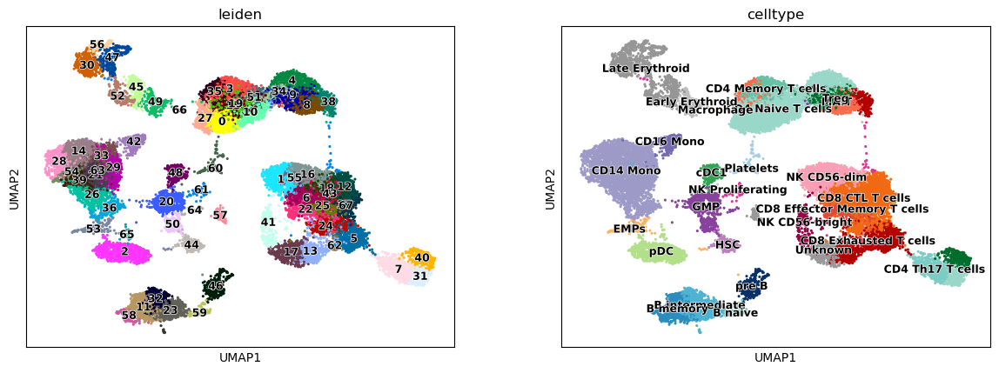

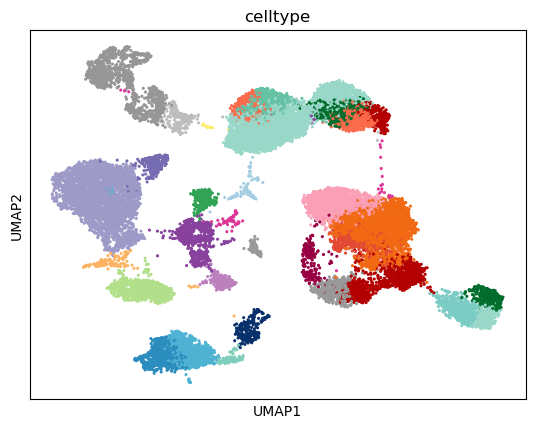

In [ ]:
adata_result, cluster_topN, topN_summary = main_cluster(
    adata_filter, n_neighbors, embs, resolution,
    threshold_main, threshold_sub, celltype_colors_dict
)

sc.pl.umap(adata_result, color=['leiden', 'celltype'], legend_loc='on data',
           size=20, legend_fontsize=9, legend_fontoutline=1)
sc.pl.umap(adata_result, color='celltype', legend_loc=None, size=20)


In [ ]:
import numpy as np
import pandas as pd
from scipy import sparse
from scipy.stats import ttest_ind, mannwhitneyu

def _get_matrix(adata, layer=None, use_raw=False):
    if use_raw:
        X = adata.raw.X
        var_names = adata.raw.var_names
    elif layer is not None:
        X = adata.layers[layer]
        var_names = adata.var_names
    else:
        X = adata.X
        var_names = adata.var_names
    if sparse.issparse(X):
        X = X.tocsr()
    return X, np.array(var_names)

def _benjamini_hochberg(p):
    p = np.asarray(p)
    n = p.size
    order = np.argsort(p)
    ranks = np.empty_like(order)
    ranks[order] = np.arange(1, n+1)
    adj = p * n / ranks
    # 保证单调
    adj_sorted = np.minimum.accumulate(adj[order][::-1])[::-1]
    out = np.empty_like(adj_sorted)
    out[order] = np.minimum(adj_sorted, 1.0)
    return out

def _looks_like_log1p(X_sample, n_check=5000):
    # 简单启发式：大多数单细胞归一化后范围较小且 >=0
    if sparse.issparse(X_sample):
        X_sample = X_sample.toarray()
    x = X_sample.ravel()
    if x.size > n_check:
        x = np.random.default_rng(0).choice(x, size=n_check, replace=False)
    return (np.nanmin(x) >= 0.0) and (np.nanpercentile(x, 99) < 50)

def find_markers(
    adata,
    groupby: str,
    group1,
    group2=None,
    *,
    layer=None,
    use_raw=False,
    test: str = "wilcoxon",          # "wilcoxon" | "t"
    min_pct: float = 0.1,
    logfc_threshold: float = 0.0,
    only_pos: bool = False,
    equal_var: bool = False,
    alternative: str = "two-sided",  # for wilcoxon (mannwhitneyu)
    return_gene_names: bool = True,
):
    """
    近似 Seurat::FindMarkers 的 Python 实现。
    返回列：p_val, p_val_adj, stat, avg_log2FC, pct_in, pct_out
    行索引为基因名（或 var 索引）。
    """
    obs = adata.obs
    if groupby not in obs:
        raise ValueError(f"`{groupby}` not in adata.obs")

    X, var_names = _get_matrix(adata, layer=layer, use_raw=use_raw)

    g = obs[groupby].values
    idx1 = np.where(g == group1)[0]
    if idx1.size == 0:
        raise ValueError(f"group1 '{group1}' 无细胞")
    if group2 is None:
        idx2 = np.where(g != group1)[0]
    else:
        idx2 = np.where(g == group2)[0]
    if idx2.size == 0:
        raise ValueError(f"对照组无细胞（group2={group2} 或 其余细胞为空）")

    X1 = X[idx1]
    X2 = X[idx2]

    # 稀疏->计算友好
    if sparse.issparse(X1): X1 = X1.tocsr()
    if sparse.issparse(X2): X2 = X2.tocsr()

    # 计算 pct（表达>0 的细胞比例）
    def pct_nonzero(M):
        if sparse.issparse(M):
            nz = (M > 0).astype(np.int8)
            return np.asarray(nz.sum(axis=0)).ravel() / M.shape[0]
        else:
            return (M > 0).mean(axis=0)

    pct1 = pct_nonzero(X1)
    pct2 = pct_nonzero(X2)

    # min_pct 过滤（任一组满足）
    keep = (pct1 >= min_pct) | (pct2 >= min_pct)

    # 组内均值
    def mean_axis0(M):
        if sparse.issparse(M):
            return np.asarray(M.mean(axis=0)).ravel()
        else:
            return M.mean(axis=0)

    mean1 = mean_axis0(X1)
    mean2 = mean_axis0(X2)

    # 判定是否像 log1p 数据
    is_log1p = _looks_like_log1p(X1) and _looks_like_log1p(X2)
    if is_log1p:
        # avg_log2FC = (mean(log1p(x))_1 - mean(log1p(x))_2) / ln(2)
        avg_log2fc = (mean1 - mean2) / np.log(2.0)
    else:
        # 线性尺度 log2((mean1+eps)/(mean2+eps))
        eps = 1e-9
        avg_log2fc = np.log2((mean1 + eps) / (mean2 + eps))

    # logfc 阈值过滤
    if logfc_threshold > 0:
        keep = keep & (np.abs(avg_log2fc) >= logfc_threshold)

    # 统计检验
    pvals = np.full(var_names.shape[0], np.nan, dtype=float)
    stats_arr = np.full_like(pvals, np.nan)

    genes_to_test = np.where(keep)[0]
    # 为了速度，逐基因循环（足够快；超大数据可并行）
    for j in genes_to_test:
        if sparse.issparse(X1):
            a = X1[:, j].toarray().ravel()
            b = X2[:, j].toarray().ravel()
        else:
            a = X1[:, j]
            b = X2[:, j]

        if test == "t":
            stat, p = ttest_ind(a, b, equal_var=equal_var, alternative=alternative)
        elif test == "wilcoxon":
            # Mann-Whitney U (独立样本，近似 Seurat Wilcoxon 行为)
            # scipy >=1.7 支持 alternative 和 method="auto"
            try:
                res = mannwhitneyu(a, b, alternative=alternative, method="auto")
                stat, p = res.statistic, res.pvalue
            except TypeError:
                # 兼容旧版 SciPy
                stat, p = mannwhitneyu(a, b, alternative=alternative)
        else:
            raise ValueError("test 仅支持 'wilcoxon' 或 't'")

        pvals[j] = p
        stats_arr[j] = stat

    # only.pos：仅保留上调（avg_log2FC > 0）
    if only_pos:
        keep = keep & (avg_log2fc > 0)

    kept_idx = np.where(keep & np.isfinite(pvals))[0]
    if kept_idx.size == 0:
        return pd.DataFrame(columns=[
            "p_val","p_val_adj","stat","avg_log2FC","pct_in","pct_out"
        ])

    padj = np.full_like(pvals, np.nan)
    padj[kept_idx] = _benjamini_hochberg(pvals[kept_idx])

    out = pd.DataFrame({
        "p_val": pvals[kept_idx],
        "p_val_adj": padj[kept_idx],
        "stat": stats_arr[kept_idx],
        "avg_log2FC": avg_log2fc[kept_idx],
        "pct_in": pct1[kept_idx],
        "pct_out": pct2[kept_idx],
    }, index=(var_names[kept_idx] if return_gene_names else kept_idx))

    # 排序：先按 p_val_adj，再按 |avg_log2FC|（only_pos 时降序）
    if only_pos:
        out = out.sort_values(["p_val_adj", "avg_log2FC"], ascending=[True, False])
    else:
        out = out.sort_values(["p_val_adj", "avg_log2FC"], ascending=[True, False])
    return out


In [ ]:
# 假设已有 adata（log1p 归一化后的表达矩阵），并在 adata.obs['louvain'] 有簇信息
res = find_markers(
    adata_result,
    groupby="celltype",
    group1="Late Erythroid",             # 目标簇
    group2=None,            # 与其余细胞比较（Seurat 默认）
    test="wilcoxon",        # 或 "t"
    min_pct=0.1,
    logfc_threshold=0.25,   # 近似 Seurat 常用阈值
    only_pos=False,
    use_raw=False,          # 若想用 adata.raw 则设 True
    layer=None              # 或填某个 layer 名
)
res.head(20)


,p_val,p_val_adj,stat,avg_log2FC,pct_in,pct_out
HBB,0.0,0.0,101767969.0,8.098404,0.969926,0.397028
HBA2,0.0,0.0,100161960.5,6.126893,0.924501,0.149606
HBA1,0.0,0.0,100123769.0,5.875045,0.922818,0.127764
SLC25A37,0.0,0.0,100318603.5,4.736057,0.925973,0.176177
SLC4A1,0.0,0.0,96927962.0,3.911075,0.848791,0.033596
HBD,0.0,0.0,89147034.5,3.442834,0.718191,0.047827
CA1,0.0,0.0,88698012.0,3.349914,0.718612,0.066922
AHSP,0.0,0.0,88689455.0,3.216377,0.712934,0.053997
ANK1,0.0,0.0,90839913.5,3.085954,0.745531,0.050529
BLVRB,0.0,0.0,90780146.5,2.799709,0.772450,0.109705


In [ ]:
import scanpy as sc
import celltypist

# # 查看可用模型
celltypist.models.models_description()

# # 下载并加载模型（返回路径）
# model_path = celltypist.models.download_models('Immune_All_High')

# 1) 逐细胞预测（不做 majority voting）
# adata_ctrl = adata[adata.obs["treat"] == "control"].copy()
pred_ctrl = celltypist.annotate(
    adata_ctrl,
    model='Immune_All_Low.pkl',   # 或你的自训模型路径
    majority_voting=False
)
adata_ctrl.obs['celltypist'] = pred_ctrl.predicted_labels

# pred_aml = celltypist.annotate(
#     adata_aml,
#     model='Immune_All_High',
#     majority_voting=False
# )
# adata_aml.obs['celltypist'] = pred_aml.predicted_labels

# 2) 若想“按簇平滑”，用你自己算的簇来投票（示例）
# sc.pp.normalize_total(adata_aml); sc.pp.log1p(adata_aml)
# sc.pp.highly_variable_genes(adata_aml); sc.tl.pca(adata_aml)
# sc.pp.neighbors(adata_aml); sc.tl.leiden(adata_aml, resolution=1.0)

# # 对每个簇取众数作为簇标签
# cluster_major = (
#     adata_aml.obs.groupby('leiden')['celltypist']
#     .agg(lambda x: x.value_counts().idxmax())
# )
# adata_aml.obs['celltypist_mv'] = adata_aml.obs['leiden'].map(cluster_major)



👉 Detailed model information can be found at `https://www.celltypist.org/models`
⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 22681 cells and 27187 genes
🔗 Matching reference genes in the model
🧬 5893 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


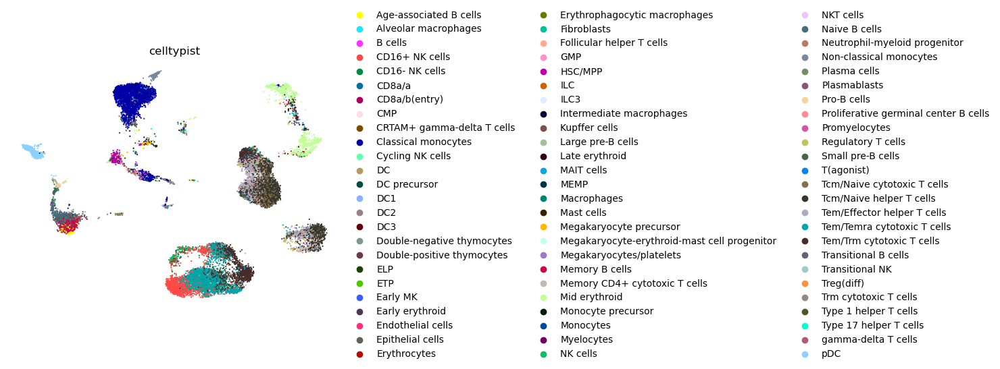

In [ ]:


# if 'X_umap' not in adata_ctrl.obsm_keys():
#     sc.pp.normalize_total(adata_ctrl); sc.pp.log1p(adata_ctrl)
#     sc.pp.highly_variable_genes(adata_ctrl)
#     sc.tl.pca(adata_ctrl); sc.pp.neighbors(adata_ctrl); sc.tl.umap(adata_ctrl)

sc.pl.umap(adata_ctrl, color='celltypist', legend_loc='right margin', frameon=False, s=10)


In [ ]:

# 统计每个 Leiden cluster 中的 celltypist 注释
cluster_celltypes = (
    adata_ctrl.obs.groupby("leiden")["celltypist"]
    .agg(lambda x: x.value_counts().index[0])  # 多数表决
)

print(cluster_celltypes)

adata_ctrl.obs["celltypist_cluster"] = adata_ctrl.obs["leiden"].map(cluster_celltypes)

leiden
0     Tem/Temra cytotoxic T cells
1        Tcm/Naive helper T cells
2             Classical monocytes
3     Tem/Effector helper T cells
4                   Naive B cells
5       Tem/Trm cytotoxic T cells
6        Tcm/Naive helper T cells
7       Tem/Trm cytotoxic T cells
8             Classical monocytes
9                             pDC
10                  Mid erythroid
11                  Mid erythroid
12            Classical monocytes
13        Non-classical monocytes
14              Small pre-B cells
15                        HSC/MPP
16                   Plasma cells
17       Megakaryocytes/platelets
Name: celltypist, dtype: category
Categories (75, object): ['Age-associated B cells', 'Alveolar macrophages', 'B cells', 'CD16+ NK cells', ..., 'Type 1 helper T cells', 'Type 17 helper T cells', 'gamma-delta T cells', 'pDC']


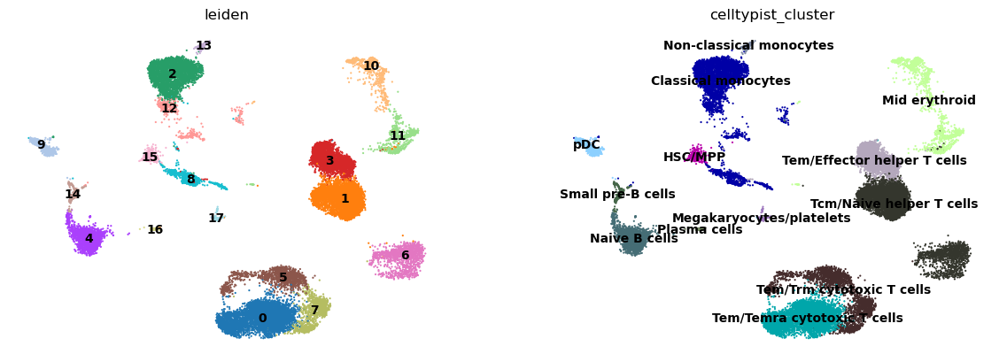

In [ ]:
sc.pl.umap(
    adata_ctrl, 
    color=["leiden", "celltypist_cluster"], 
    legend_loc="on data", 
    frameon=False, 
    s=10
)


In [ ]:

# 统计每个 Leiden cluster 中的 celltypist 注释
cluster_azimuth = (
    adata_ctrl.obs.groupby("leiden")["azimuthNames"]
    .agg(lambda x: x.value_counts().index[0])  # 多数表决
)

print(cluster_azimuth )

adata_ctrl.obs["azimuthNames_cluster"] = adata_ctrl.obs["leiden"].map(cluster_azimuth)

leiden
0     CD8 Effector_2
1         CD4 Memory
2          CD14 Mono
3         CD4 Memory
4            Naive B
5     CD8 Effector_2
6         CD4 Memory
7     CD8 Effector_1
8                GMP
9                pDC
10        Late Eryth
11        Late Eryth
12         CD14 Mono
13         CD16 Mono
14    transitional B
15               HSC
16            Plasma
17          Platelet
Name: azimuthNames, dtype: category
Categories (40, object): ['ASDC', 'BaEoMa', 'CD4 Effector', 'CD4 Memory', ..., 'pre-mDC', 'pre-pDC', 'pro B', 'transitional B']


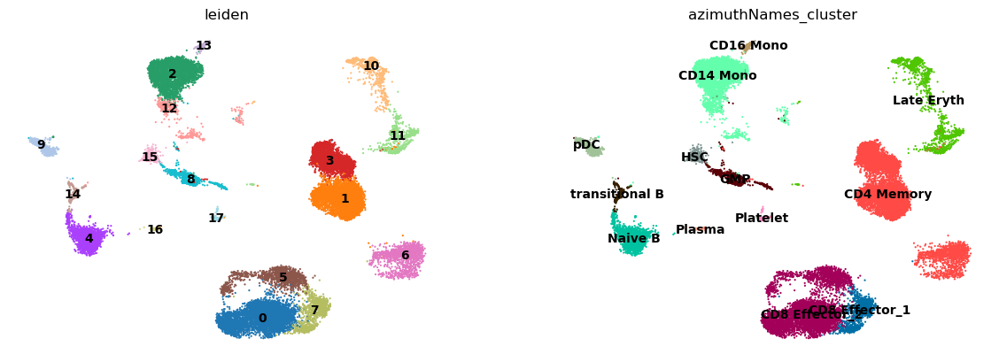

In [ ]:
sc.pl.umap(
    adata_ctrl, 
    color=["leiden", "azimuthNames_cluster"], 
    legend_loc="on data", 
    frameon=False, 
    s=10
)


In [ ]:
cluster_azimuth

leiden
0     CD8 Effector_2
1         CD4 Memory
2          CD14 Mono
3         CD4 Memory
4            Naive B
5     CD8 Effector_2
6         CD4 Memory
7     CD8 Effector_1
8                GMP
9                pDC
10        Late Eryth
11        Late Eryth
12         CD14 Mono
13         CD16 Mono
14    transitional B
15               HSC
16            Plasma
17          Platelet
Name: azimuthNames, dtype: category
Categories (40, object): ['ASDC', 'BaEoMa', 'CD4 Effector', 'CD4 Memory', ..., 'pre-mDC', 'pre-pDC', 'pro B', 'transitional B']